# **Helmet Violation Detection: The Complete Pipeline**

This notebook builds the entire helmet violation detection system, one module
at a time. Each section explains a component of the system, and then shows how to implement it in Python.
Writes the final file using `%%writefile` command.

## **What the System Does**

The system accepts a dashcam video and produces a list of riders who were
travelling without a helmet, together with an annotated image of each one as
supporting evidence.

## **The Eight Modules**

| Order | Module | Responsibility |
|---|---|---|
| 1 | `config.py` | Holds every path, class name and threshold in one place |
| 2 | `detection.py` | Reshapes raw model output into per-class lookup tables |
| 3 | `geometry.py` | Reduces bounding boxes to comparable points and overlap scores |
| 4 | `association.py` | Matches riders to motorcycles, heads to riders, plates to motorcycles |
| 5 | `rm_instance.py` | Stores what the system learns about each rider over time |
| 6 | `temporal.py` | Combines many frames into a single verdict |
| 7 | `visualization.py` | Renders pipeline state as reviewable images |
| 8 | `main.py` | Runs every stage in order across a full video |

## **The Central Difficulty**

A detection model reports **objects**. It does not report **relationships**.
The model can state that a helmet is present and that a rider is present, but
it cannot state that the helmet belongs to that rider. Every relationship in
this system is inferred from geometry, and then stabilised across time. That
inference is the substance of the work, and the modules below address it in
sequence.

## **How to Use This Notebook**

Execute the cells in order. Each `%%writefile` cell creates or replaces a
Python module in the `src` directory, and the demonstration cells that follow import
those modules directly. The `autoreload` extension in the next cell ensures the
notebook always uses the most recently written version of each file.

In [1]:
!git clone https://github.com/EmertxeInfoTech/edge-ai-helmet-detection-workshop.git
%cd edge-ai-helmet-detection-workshop/final
!mkdir -p src output
!ls -lh models/ sample_videos/

Cloning into 'edge-ai-helmet-detection-workshop'...
remote: Enumerating objects: 335, done.
remote: Total 335 (delta 0), reused 0 (delta 0), pack-reused 335 (from 1)
Receiving objects: 100% (335/335), 329.37 MiB | 18.66 MiB/s, done.
Resolving deltas: 100% (133/133), done.
Updating files: 100% (66/66), done.
/content/edge-ai-helmet-detection-workshop/final
models/:
total 153M
-rw-r--r-- 1 root root 24M Sep 18 13:27 best.engine
-rw-r--r-- 1 root root 22M Sep 18 13:27 best.fp16.onnx
-rw-r--r-- 1 root root 44M Sep 18 13:27 best.onnx
-rw-r--r-- 1 root root 65M Sep 18 13:27 best.pt

sample_videos/:
total 118M
-rw-r--r-- 1 root root 100M Sep 18 13:27 20211125082353_0060.mp4
-rw-r--r-- 1 root root  30M Sep 18 13:27 sample.mp4


In [2]:
# IPython's autoreload extension imports `imp`, a module recent Python versions
# removed. Provide a minimal stand-in first; skipped when it isn't needed.
import sys, types, importlib

if "imp" not in sys.modules:
    try:
        import imp  # noqa: F401
    except ImportError:
        shim = types.ModuleType("imp")
        shim.reload = importlib.reload
        sys.modules["imp"] = shim

# Reload imported modules automatically whenever their source files change,
# so a rewritten .py file takes effect without restarting the kernel.
%load_ext autoreload
%autoreload 2

---

# **1. config.py: Centralised Configuration**

## **The Principle**

Every setting the pipeline depends on is defined in one file. No other module
hardcodes a path, a class identifier, or a threshold; each one imports the
value from here.

This arrangement provides two benefits:

1. **Tuning happens in one location.** Adjusting the system means editing a
   single file rather than searching through seven.
2. **Changes remain traceable.** When a threshold is altered and the results
   shift, the cause is unambiguous.


<!--
COMMENT

## **The Five Object Classes**

The detection model was trained to recognise five classes, each identified by a
fixed number. The pipeline uses the mapping below to interpret those numbers.

| Class ID | Name | Meaning |
|---|---|---|
| 0 | `motorcycle` | The vehicle itself |
| 1 | `rider` | The person on the vehicle |
| 2 | `helmet` | A head wearing a helmet |
| 3 | `no_helmet` | A head without a helmet |
| 4 | `license_plate` | The number plate on the vehicle |

## **Processing Controls**

- **`FRAME_LIMIT`** caps how many frames are read. `None` processes the entire
  video. A smaller value significantly accelerates development, because every
  frame runs a neural network and a sixty second clip at 25 frames per second
  contains 1500 of them.
- **`TRACKER`** selects the algorithm that assigns stable identifiers to objects
  across frames. ByteTrack is chosen deliberately for edge hardware: it is
  computationally light, and a heavier tracker would consume the processing
  budget the system is trying to protect.

## **Matching Thresholds**

These three values control how willing the system is to pair two objects
together. Each is a **maximum cost**, meaning a pairing is rejected when
matching the two objects costs more than the stated amount.

- **`RIDER_MOTO_MAX_COST = 0.9`** requires interpretation. The cost of pairing a
  rider with a motorcycle is calculated as `1 - IoU`, where IoU measures how
  much two boxes overlap. A cost ceiling of 0.9 therefore imposes an overlap
  floor of 0.1: the two boxes must share at least ten percent of their combined
  area.
- **`HEAD_RIDER_MAX_COST = 60`** and **`PLATE_MOTO_MAX_COST = 100`** are measured
  in pixels rather than overlap, which is why their magnitudes are so different.
  A helmet detected more than sixty pixels from a rider's head position is not
  that rider's helmet.

## **Evidence Thresholds**

A single frame is never sufficient. A rider may be blurred, partially occluded,
or captured mid-turn. Two settings prevent one poor frame from generating a
citation:

- **`MIN_OBSERVATIONS = 3`** requires the rider to have been observed and
  classified at least three times before any verdict is produced.
- **`MIN_CONFIDENCE = 0.7`** requires the averaged detector confidence behind
  that verdict to reach seventy percent. Below that, the system reports
  "unknown" rather than guessing.

-->

In [3]:
%%writefile src/config.py

"""
Central configuration for the helmet violation detection pipeline.

Paths are resolved relative to the project root, so the same file works
on a Jetson device, in Google Colab, or in any other location.
"""

# The os module supplies path utilities that behave correctly on every
# operating system, which keeps the project portable.
import os

# Set PROJECT_ROOT to the current working directory when the script is run.
# This ensures paths are correct relative to where the notebook is executed.
PROJECT_ROOT = os.getcwd()

# Location of the trained detection weights the pipeline loads.
MODEL_PATH = os.path.join(PROJECT_ROOT, "models", "best.pt")
# Location of the input video.
VIDEO_PATH = os.path.join(PROJECT_ROOT, "sample_videos", "sample.mp4")
# Directory into which reports and violation snapshots are written.
OUTPUT_DIR = os.path.join(PROJECT_ROOT, "output")

# Table for mapping class IDs to class names
# Model generates one of these IDs for each detected object
CLASS_NAMES = {
    # The person travelling on the motorcycle.
    0: "rider",
    # The motorcycle itself.
    1: "motorcycle",
    # A head that is wearing a helmet.
    2: "helmet",
    # A head that is not wearing a helmet.
    3: "no_helmet",
    # The number plate mounted on the motorcycle.
    4: "license_plate",
}

# Maximum number of frames to process; None means process the whole video.
FRAME_LIMIT = None
# Configuration file naming the tracking algorithm used to assign track IDs.
TRACKER = "bytetrack.yaml"

# If the paired rider and motorcycle boxes has IoU or xdist cost > this value,
# the pairing is rejected.
RIDER_MOTO_MAX_COST_IOU = 0.9
RIDER_MOTO_MAX_COST_XDIST = 300
# Rejection ceiling, in pixels, between a rider's head position and a helmet.
HEAD_RIDER_MAX_COST = 60
# Rejection ceiling, in pixels, between a motorcycle and its number plate.
# Plates are small and often partly obscured, so the allowance is larger.
PLATE_MOTO_MAX_COST = 100

# Frames a rider must be observed before the system will produce any verdict.
MIN_OBSERVATIONS = 3
# Averaged detector confidence a verdict must reach before it is accepted.
MIN_CONFIDENCE = 0.7

Overwriting src/config.py


## Verifying the paths

In [4]:
# The configuration module written above, now imported as a normal module.
import os
import src.config as config

# # Confirm that the two input files the pipeline requires are actually present.
print("model exists:", os.path.exists(config.MODEL_PATH), "->", config.MODEL_PATH)
print("video exists:", os.path.exists(config.VIDEO_PATH), "->", config.VIDEO_PATH)
print("output dir exists:", os.path.exists(config.OUTPUT_DIR), "->", config.OUTPUT_DIR)

model exists: True -> /content/edge-ai-helmet-detection-workshop/final/models/best.pt
video exists: True -> /content/edge-ai-helmet-detection-workshop/final/sample_videos/sample.mp4
output dir exists: True -> /content/edge-ai-helmet-detection-workshop/final/output


### **Installing Necessary Modules**

In [5]:
!pip install ultralytics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 72.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 7.9 MB/s eta 0:00:00


---

# **1. How to run the model and reshape the output**


In [6]:
# The YOLO class provides both detection and multi-object tracking.
from ultralytics import YOLO
import src.config as config

# Load the trained weights once; the model is reused throughout the notebook.
model = YOLO(config.MODEL_PATH)

# Run tracking over the video.
results = model.track(
    source=config.VIDEO_PATH,                # Source video to process
    classes=list(config.CLASS_NAMES.keys()), # Need to specify the class IDs to detect, not the names
    tracker=config.TRACKER,                  # Use the tracker specified in the configuration file (bytetrack.yaml)
    persist=True,                            # Keep the tracker state between frames so that track IDs are consistent
    stream=True,                             # Yield frames one at a time rather than accumulating all results in memory
    verbose=False                            # Suppresses the progress bar and other console output
)

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.13.15 environment at: /usr
Resolved 2 packages in 195ms
Prepared 1 package in 27ms
Installed 1 package in 1ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 0.5s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect



In [7]:
# because stream=True, results is a generator that yields one frame at a time,
# when we use next(), or for loop

first_result = next(results)

# first_result is a `ultralytics.engine.results.Results` object,
# which contains the detection results for the first frame of the video.

print("First result type:", type(first_result))
print("Original frame shape:", first_result.orig_shape)
print("Original frame:\n", first_result.orig_img)

First result type: <class 'ultralytics.engine.results.Results'>
Original frame shape: (1440, 2560)
Original frame:
 [[[218 172 161]
  [218 172 161]
  [218 172 161]
  ...
  [105 101  83]
  [104 100  82]
  [104 100  82]]

 [[218 172 161]
  [218 172 161]
  [218 172 161]
  ...
  [105 101  83]
  [104 100  82]
  [104 100  82]]

 [[218 172 161]
  [218 172 161]
  [218 172 161]
  ...
  [105 100  86]
  [103  98  84]
  [103  98  84]]

 ...

 [[ 32  39  33]
  [ 32  39  33]
  [ 34  41  35]
  ...
  [ 69  15   0]
  [ 72  19   0]
  [ 74  21   0]]

 [[ 37  44  38]
  [ 37  44  38]
  [ 36  43  37]
  ...
  [ 82  13   0]
  [ 87  16   3]
  [ 89  18   5]]

 [[ 39  46  40]
  [ 39  46  40]
  [ 38  45  39]
  ...
  [ 82  13   0]
  [ 87  16   3]
  [ 89  18   5]]]


### boxes class
The `boxes` class contains the bounding boxes for all detected objects in that frame. It has four attributes: `cls`, `id`, `xyxy` and `conf`.

| Field | Contents |
|---|---|
| `boxes.cls` | Class number, 0 to 4, matching `CLASS_NAMES` |
| `boxes.id` | Tracking identifier, stable across frames |
| `boxes.xyxy` | Box corners expressed as `[x1, y1, x2, y2] (Top-left, Bottom-right corner)` |
| `boxes.conf` | Detection confidence, between 0 and 1 |

In [8]:
# Check for the presence of boxes in the first frame
print("Number of boxes detected:", len(first_result.boxes))
print("Type: ", type(first_result.boxes))
print("Classes:", first_result.boxes.cls)
print("IDs:", first_result.boxes.id)
print("Coordinates:", first_result.boxes.xyxy)
print("Confidences:", first_result.boxes.conf)

Number of boxes detected: 22
Type:  <class 'ultralytics.engine.results.Boxes'>
Classes: tensor([1., 1., 0., 1., 0., 1., 1., 3., 4., 4., 1., 0., 2., 1., 0., 0., 0., 0., 0., 2., 3., 1.], device='cuda:0')
IDs: tensor([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22.], device='cuda:0')
Coordinates: tensor([[ 817.6790,  985.4633,  972.5251, 1203.2953],
        [2018.6893,  959.3422, 2127.1670, 1047.4948],
        [ 838.7049,  922.6167,  953.1574, 1140.7473],
        [1210.4006,  988.7046, 1329.1570, 1069.8872],
        [1052.4077,  959.7372, 1116.5410, 1059.7548],
        [1327.8577, 1005.4304, 1464.5042, 1084.0757],
        [1054.2639,  989.2229, 1119.9895, 1080.1562],
        [ 873.6912,  923.6986,  905.9438,  963.0128],
        [ 837.8735, 1124.5985,  875.7031, 1146.3102],
        [1073.3646, 1045.1052, 1089.9410, 1054.7034],
        [1443.5668,  988.5073, 1468.4193, 1034.0693],
        [1250.2892,  960.9902, 1291.7391, 1069.563

frame 1: 22 objects   |   frame 2: 19 objects
tracked through both frames (19): [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 20, 22]
present only in frame 1:     [18, 19, 21]
present only in frame 2:     []


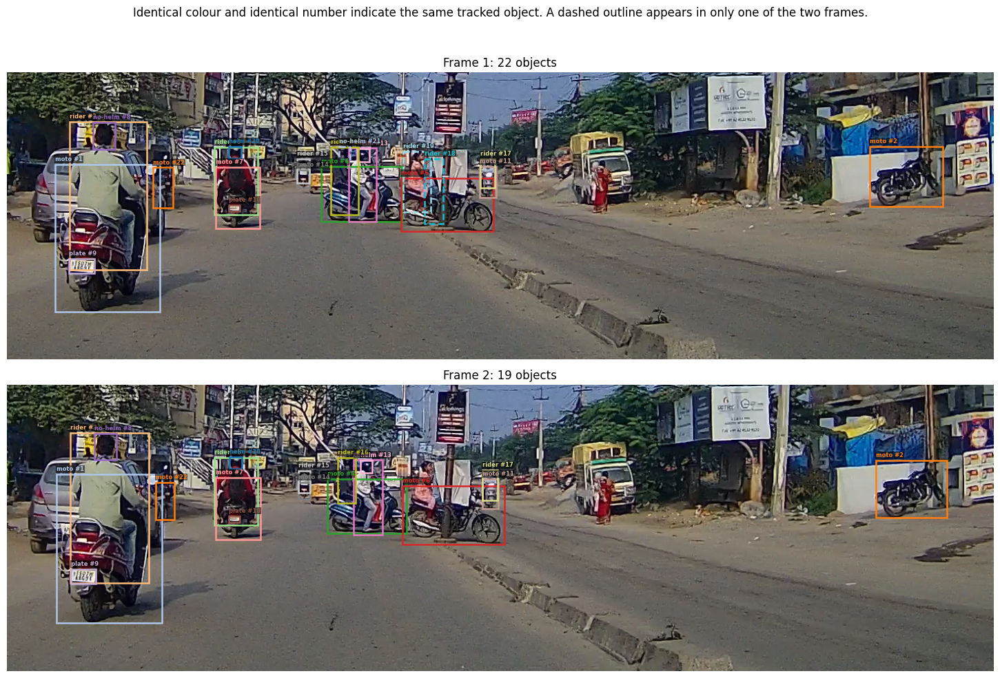

In [9]:
from src.helper import show_tracked_pair, show_box_anatomy
second_result = next(results)
show_tracked_pair(first_result, second_result, config.CLASS_NAMES, figsize=(22, 10))

tracking identifier 1, class 'motorcycle'

                x1      y1      x2      y2    width   height
frame 1        818     985     973    1203      155      218
frame 2        819     981     976    1201      156      220
change          +2      -4      +3      -2


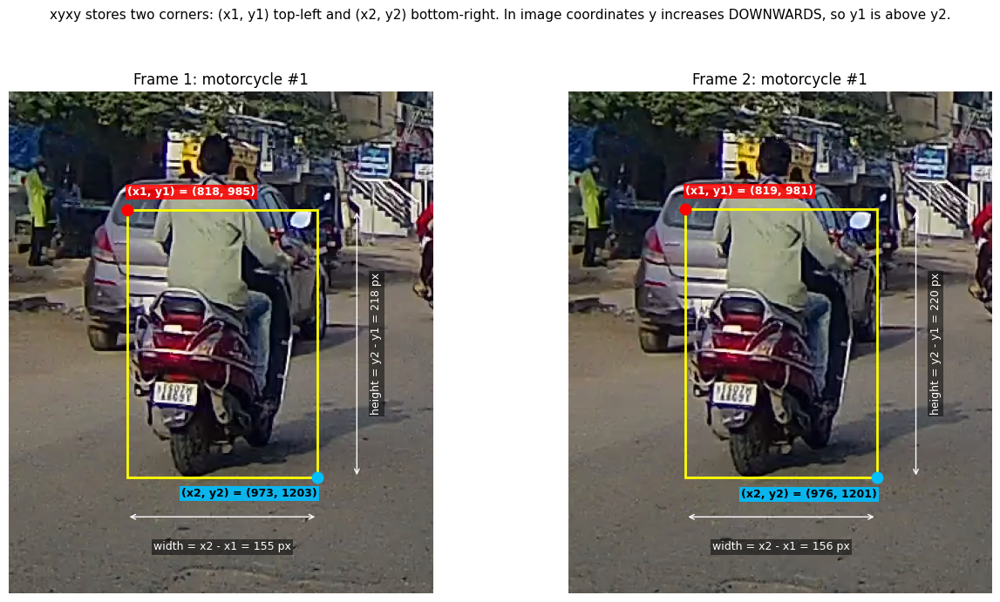

In [10]:
show_box_anatomy(first_result, second_result, config.CLASS_NAMES)

### How to find a clip from the middle and traverse all the results?

In [11]:
# We can use for loop to find each result
# Frame number to retrieve from the results generator
REQ_CLIP_FRAME = 10
for i, r in enumerate(results):
    if i == REQ_CLIP_FRAME:
        frame = r
        break

# Report the raw structure the model handed back for this single frame.
print("objects found:", len(frame.boxes))
print("class numbers:", frame.boxes.cls.tolist())
print("track IDs:    ", frame.boxes.id.tolist())

objects found: 22
class numbers: [1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 3.0, 4.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, 3.0]
track IDs:     [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 12.0, 13.0, 14.0, 15.0, 16.0, 20.0, 26.0, 28.0, 32.0, 33.0, 56.0, 58.0]


### **The Problem**

The detection model returns everything it finds in a frame as a single flat
list. Motorcycles, riders, helmets and plates are mixed together, distinguished
only by a class number.

- Subsequent stage requires "all riders" and "all motorcycles" as separate
  groups. We also need to find a specific rider by identifier.  

Working directly with the flat list would mean filtering and searching it
repeatedly, in several different files.

### **The Solution**

`detection.py` performs that reshaping once, in one place. It is the smallest
module in the pipeline and exists purely to simplify everything downstream.

In [12]:
%%writefile src/detection.py

"""
Stage 1: convert a raw tracking result into clean per-class dictionaries.

The model reports every object in a frame as one flat list. This module
reorganises that list so any later stage can address an object directly,
for example as detections["rider"][7].
"""

# The class-number to class-name mapping defined in the configuration module.
from src.config import CLASS_NAMES

# Reorganise one frame's tracking result into per-class lookup tables.
def get_frame_detections(r, class_names=None):
    """Return a pair of dictionaries sharing the same structure.

    detections[class_name][track_id]  is the bounding box [x1, y1, x2, y2].
    confidences[class_name][track_id] is the model's confidence, 0 to 1.
    """
    # Fall back to the configured mapping when the caller supplies none.
    class_names = class_names or CLASS_NAMES
    # Pre-create one empty dictionary per class so every class key always
    # exists, allowing callers to write det["helmet"] without checking first.
    detections = {name: {} for name in class_names.values()}
    # Build a parallel structure that will hold the confidence of each detection.
    confidences = {name: {} for name in class_names.values()}

    # A frame containing no tracked objects yields None rather than an empty
    # list, and calling .tolist() on None would raise an exception.
    if r.boxes.id is None:
        # Return the empty tables, because an empty frame is a normal event.
        return detections, confidences

    # Class number of every detected object, converted to list
    classes = r.boxes.cls.tolist()
    # Tracking identifier of every object, which remains stable across frames.
    track_ids = r.boxes.id.tolist()
    # Corner coordinates of every object in [x1, y1, x2, y2] pixel form.
    boxes = r.boxes.xyxy.tolist()
    # Detection confidence of every object, expressed between 0 and 1.
    confs = r.boxes.conf.tolist()

    # The four lists are aligned by position, so zip walks one object at a time.
    for cls, tid, box, conf in zip(classes, track_ids, boxes, confs):
        # Translate the numeric class into its readable name.
        # since cls is in float, convert it to int for lookup
        name = class_names.get(int(cls))
        # Silently skip any class the configuration does not define.
        if name:
            # File the box under its class name and tracking identifier.
            detections[name][int(tid)] = box
            # File the matching confidence in the parallel structure.
            confidences[name][int(tid)] = conf

    # Return both tables to the caller.
    return detections, confidences

Overwriting src/detection.py


### **Demonstration for one frame**

The cell below runs the tracker over the sample video, shows the result on the frame that was extracted earlier

In [13]:
# The module written above, reshaping the same frame into per-class tables.
import src.detection as detection

# dets holds the boxes; confs holds the matching confidence scores.
dets, confs = detection.get_frame_detections(frame)

# Every class appears as a key, including those with no detections at all.
for cls_name, track_dict in dets.items():
    print(f"{cls_name:<15} {len(track_dict):>2} found -> IDs {list(track_dict.keys())}")

rider            8 found -> IDs [3, 5, 12, 15, 16, 26, 33, 56]
motorcycle       7 found -> IDs [1, 2, 4, 6, 7, 14, 32]
helmet           2 found -> IDs [13, 28]
no_helmet        3 found -> IDs [8, 20, 58]
license_plate    2 found -> IDs [9, 10]


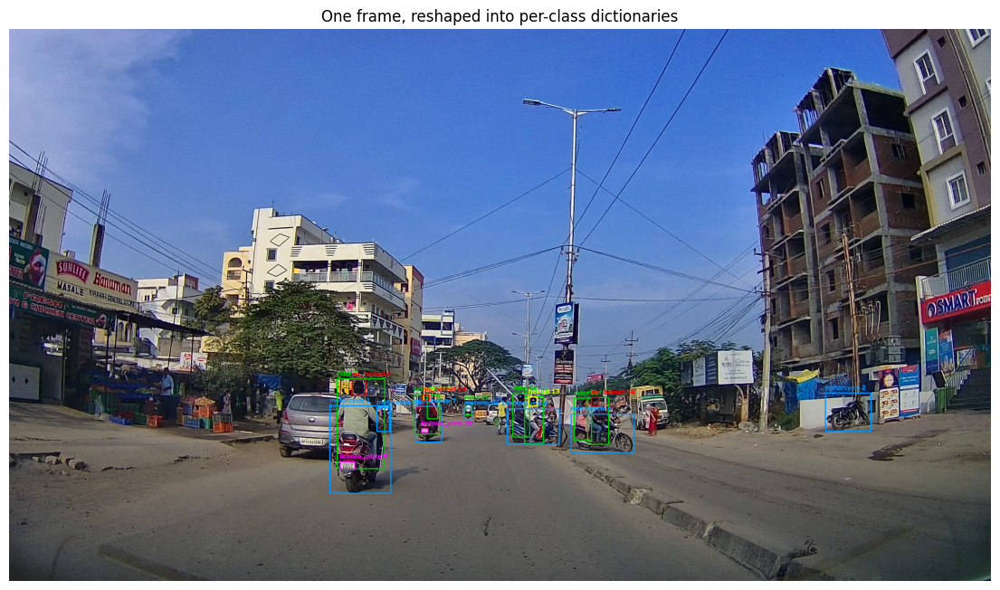

In [14]:
# OpenCV performs the drawing; matplotlib displays the result in the notebook.
import cv2
import matplotlib.pyplot as plt

# One colour per class, expressed in OpenCV's blue-green-red channel order.
colors = {
    "motorcycle":    (255, 150, 0),
    "rider":         (0, 200, 0),
    "helmet":        (0, 255, 255),
    "no_helmet":     (0, 0, 255),
    "license_plate": (255, 0, 255),
}

# Work on a copy, because OpenCV draws directly into the array it is given.
img = frame.orig_img.copy()

# Draw every detected object, grouped by class.
for name, objects in dets.items():
    for tid, box in objects.items():
        # Drawing requires integer pixel indices.
        x1, y1, x2, y2 = map(int, box)
        # Outline the object in its class colour.
        cv2.rectangle(img, (x1, y1), (x2, y2), colors[name], 2)
        # Label it with the class name and tracking identifier.
        cv2.putText(img, f"{name} {tid}", (x1, max(y1 - 8, 15)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, colors[name], 2)

# Display the annotated frame, converting from OpenCV's BGR order to RGB.
plt.figure(figsize=(14, 8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("One frame, reshaped into per-class dictionaries")
plt.axis("off")
plt.show()

## **What Remains Missing**

Examine the annotated frame above. The model has located riders, and it has
located helmets, but nothing yet indicates which helmet belongs to which rider.
The same holds for riders and motorcycles.

Detection produces **objects**. It does not produce **relationships**. Every box
sits on the frame independently, with no notion that a particular rider is
travelling on a particular motorcycle.

Constructing those links is the next stage, and it proves harder than detection
itself, because the model offers no assistance. The relationships must be
inferred from geometry alone.

---

# **3. geometry.py: Reference Geometric Metrics and Overlap**

## **The Problem**

Association module must decide which boxes belong together, and the model provides no
information. A helmet box and a rider box arrive as unrelated rectangles.

Therefore, the pairing must be defined based on some geometric measure between the two boxes.

## **Box Coordinates**

Every box in this pipeline is four numbers, `[x1, y1, x2, y2]`, giving the
top-left and bottom-right corners in pixels.

One convention frequently causes confusion: in image coordinates, **y increases
downwards**. Therefore `y1` is the top edge and `y2` is the bottom edge, and a
box near the top of the frame carries small y values.

## **The Four Reference Metrics**

Each function gives a useful score for a particular kind of match. The table below summarises the four functions:

| Function | Returns | Formula|
|---|---|---|
| `x_center` | Horizontal midpoint | $(x_1 + x_2) / 2$ |
| `top_center` | Midpoint of the top edge | $(x_1 + x_2) / 2, y_1$ |
| `bottom_center` | Midpoint of the bottom edge | $(x_1 + x_2) / 2, y_2$ |
| `center` | Geometric centre | $((x_1 + x_2) / 2, (y_1 + y_2) / 2)$ |

## **Why the Plain Centre Is Insufficient**

A rider's box covers an entire body, so its centre sits at approximately the
torso, which is nowhere near the head. Since `HEAD_RIDER_MAX_COST` is sixty
pixels, a helmet measured from the rider's top edge falls comfortably inside
that limit, while the same helmet measured from the torso would be rejected as
too distant. The same reasoning applies in reverse to number plates.

## **Overlap, and Why Above Metrics Are Not Enough**

The four functions above reduce a box to point, which discards its size. For
rider-to-motorcycle matching that is inadequate, because two objects can be
horizontally aligned while being nowhere near one another.

Intersection over Union, abbreviated IoU, preserves the whole rectangle. It
asks: of the total area the two boxes cover between them, how much is shared?

$$\text{IoU} = \frac{\text{area of intersection}}{\text{area of union}}$$

The result ranges from 0, meaning no contact, to 1, meaning identical boxes.

## **How to calculate IoU**

<p align="center">
  <img src="assets/iou.png" alt="Intersection over Union" width="800" />
</p>

### **Intersection ($A \cap B$)**

If two boxes $A$ and $B$ are defined by their top-left and bottom-right corners as follows:
* $A = (x_0^A, y_0^A, x_1^A, y_1^A)$
* $B = (x_0^B, y_0^B, x_1^B, y_1^B)$

We can find the intersection box coordinates using the following steps:
- Find the top-left corner of the overlapping region by taking the maximum of the starting coordinates:

$$x_0^I = \max(x_0^A, x_0^B)$$


$$y_0^I = \max(y_0^A, y_0^B)$$


- Find the bottom-right corner of the overlapping region by taking the minimum of the ending coordinates:

$$x_1^I = \min(x_1^A, x_1^B)$$


$$y_1^I = \min(y_1^A, y_1^B)$$



**Intersection Area ($A \cap B$)**

* Calculate the width and height of the intersection by subtracting the starting coordinates from the ending coordinates.
* If the boxes do not intersect, the resulting width or height will yield a negative number. To handle this, cap the dimensions at zero using a max function:

$$w = \max(0, x_1^I - x_0^I)$$


$$h = \max(0, y_1^I - y_0^I)$$


* The area of the intersection is the product of these capped dimensions:

$$\text{Area}(A \cap B) = w \times h$$



### **Union ($A \cup B$)**

* The union is the total combined area of both bounding boxes. Because simply adding the two areas together counts the overlapping region twice, you must subtract the intersection area once to get the true union:

$$\text{Area}(A \cup B) = \text{Area}(A) + \text{Area}(B) - \text{Area}(A \cap B)$$


* The individual box areas are calculated conventionally:

$$\text{Area}(A) = (x_1^A - x_0^A) \times (y_1^A - y_0^A)$$


$$\text{Area}(B) = (x_1^B - x_0^B) \times (y_1^B - y_0^B)$$

In [15]:
%%writefile src/geometry.py

"""
Geometric helpers shared across every association stage.

Each function reduces a bounding box to the single point, orthe single score,
that makes a particular comparison meaningful.
"""

# Horizontal midpoint of a box.
def x_center(box):
    """Implemented to check the baseline method."""
    # Only the two horizontal edges are required; the vertical edges are discarded.
    x1, _, x2, _ = box
    # The point midway between the left and right edges.
    return (x1 + x2) / 2


# Midpoint of the top edge of a box.
def top_center(box):
    """Applied to the RIDER box when matching heads, because a head sits at
    the top of a rider's body rather than at its vertical centre."""
    # The top edge y1 is retained; the bottom edge is not required.
    x1, y1, x2, _ = box
    # Horizontal midpoint paired with the top edge.
    return ((x1 + x2) / 2, y1)


# Midpoint of the bottom edge of a box.
def bottom_center(box):
    """Applied to the MOTORCYCLE box when matching number plates, because a
    plate is mounted low on the vehicle, near the bottom of its box."""
    # The bottom edge y2 is retained; the top edge is not required.
    x1, _, x2, y2 = box
    # Horizontal midpoint paired with the bottom edge.
    return ((x1 + x2) / 2, y2)


# Geometric centre of a box.
def center(box):
    """Applied to the helmet box and to the number plate box, which form the
    opposite side of each match. These objects carry no directional bias of
    their own, so their plain centre is the correct reference point."""
    # All four edges are required to compute a true centre.
    x1, y1, x2, y2 = box
    # Midpoint taken horizontally and vertically.
    return ((x1 + x2) / 2, (y1 + y2) / 2)


# Intersection over Union between two boxes given as [x1, y1, x2, y2].
def iou(box_a, box_b):
    """Returns the shared area divided by the combined area, which is 0.0 for
    boxes that do not touch and 1.0 for boxes that coincide exactly."""
    # Corner coordinates of the first box.
    ax1, ay1, ax2, ay2 = box_a
    # Corner coordinates of the second box.
    bx1, by1, bx2, by2 = box_b
    # Top-left corner of the shared region
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    # Bottom-right corner of the shared region
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    # Clamp both dimensions at zero. Boxes that do not touch produce an
    # inverted rectangle whose two negative dimensions would otherwise
    # multiply into a positive area.
    iw, ih = max(0, ix2 - ix1), max(0, iy2 - iy1)
    # Area shared by the two boxes.
    inter = iw * ih
    # Total area of the first box.
    area_a = max(0, ax2 - ax1) * max(0, ay2 - ay1)
    # Total area of the second box.
    area_b = max(0, bx2 - bx1) * max(0, by2 - by1)
    # Combined area, subtracting the shared region that both areas included.
    union = area_a + area_b - inter
    # Guard against division by zero for degenerate boxes enclosing no area.
    return inter / union if union > 0 else 0.0

Overwriting src/geometry.py


Horizontal distance rates the unrelated object as the **better** match, because
it happens to be more precisely aligned from left to right. Overlap correctly
assigns it a score of zero.

The explanation is that `x_center` observes only one number per box. It cannot
distinguish "directly below the rider" from "two hundred pixels up the frame",
because it never examines the vertical coordinate at all.

`x_center` remains in the module so that the two methods can be compared side
by side in the association stage, but it is no longer the default.

### IoU across differrent horizontal distances

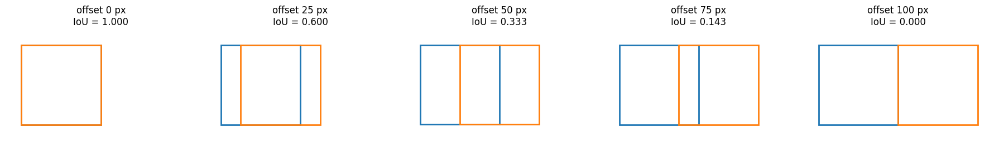

In [16]:
# matplotlib patches are used to draw the two rectangles being compared.
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from src.geometry import iou

# A stationary reference box, 100 pixels square.
fixed = (0, 0, 100, 100)
# A series of horizontal displacements to apply to a second identical box.
offsets = [0, 25, 50, 75, 100]

# One subplot per displacement.
fig, axes = plt.subplots(1, len(offsets), figsize=(18, 4))

# Draw the pair at each displacement and report the resulting overlap.
for ax, dx in zip(axes, offsets):
    # The second box, shifted horizontally by dx pixels.
    moving = (dx, 0, dx + 100, 100)
    # Overlap between the stationary box and the shifted one.
    score = iou(fixed, moving)
    # Outline the stationary box.
    ax.add_patch(patches.Rectangle((0, 0), 100, 100, fill=False, edgecolor="tab:blue", lw=2))
    # Outline the shifted box.
    ax.add_patch(patches.Rectangle((dx, 0), 100, 100, fill=False, edgecolor="tab:orange", lw=2))
    # Fix the axis limits so every panel shares the same scale.
    ax.set_xlim(-20, 220); ax.set_ylim(-20, 120)
    ax.set_aspect("equal")
    # Label the panel with its displacement and overlap score.
    ax.set_title(f"offset {dx} px\nIoU = {score:.3f}")
    ax.axis("off")

plt.tight_layout()
plt.show()

The relationship is not linear. Displacing a box by half its width reduces IoU
to 0.33 rather than 0.5, because the union grows at the same time the
intersection shrinks.

---

# **4. association.py: Building Relationships**

## **The Problem**

This is the point at which the pipeline stops listing objects and begins
constructing relationships.

Detection reports five riders and four motorcycles. Nothing in that output
states that rider seven is travelling on motorcycle twelve. A helmet violation,
however, is a statement about *a rider on a motorcycle*. An incorrect pairing
attributes the violation to the wrong person, which is a worse outcome than
missing it entirely.

Three matches are produced in this module, all using identical machinery:

1. Riders to motorcycles
2. Helmets and no-helmets to riders
3. Number plates to motorcycles

## **Why a Greedy Approach Fails**

The obvious method is to repeatedly select the cheapest remaining pairing. This
is known as a greedy approach, and it fails predictably. The cell below
demonstrates the failure on a small table.

In [17]:
# NumPy provides the array used to hold the table of pairing costs.
import numpy as np

# A small cost table: three riders, three motorcycles, lower cost is better.
# Here cost can be defined as the distance between the rider and the bike, or
# any other metric that makes sense for pairing.

#    bike A  bike B  bike C
costs = np.array([
    [  1,      2,      99  ],   # rider 1
    [  2,      99,     99  ],   # rider 2
    [  99,     99,     3   ],   # rider 3
])

# Track which rows and columns have been consumed, and the running total.
taken_rows, taken_cols, greedy_total = set(), set(), 0
# Work on a float copy so consumed cells can be set to infinity.
work = costs.astype(float).copy()

# Repeatedly select the lowest remaining cost in the whole table.
for _ in range(3):
    # Locate the position of the smallest remaining value.
    i, j = np.unravel_index(np.argmin(work), work.shape)
    # Accumulate the cost of the pairing just selected.
    greedy_total += costs[i, j]
    # Report the selection.
    print(f"greedy selects rider {i+1} -> bike {'ABC'[j]}  (cost {costs[i, j]})")
    # Remove that rider from further consideration.
    work[i, :] = np.inf
    # Remove that motorcycle from further consideration.
    work[:, j] = np.inf

# The total cost of the arrangement the greedy method produced.
print(f"\ngreedy total: {greedy_total}")

greedy selects rider 1 -> bike A  (cost 1)
greedy selects rider 3 -> bike C  (cost 3)
greedy selects rider 2 -> bike B  (cost 99)

greedy total: 103


The greedy method selects rider 1 with bike A first, because 1 is the smallest
value in the table. That selection leaves rider 2 with nothing but a cost of 99.

However, rider 1 paired with bike B costs only 2, and would leave bike A
available for rider 2. The total cost of that arrangement is 2 + 2 + 3 = 7,
compared with 1 + 99 + 3 = 103.

The locally optimal choice blocked the globally optimal arrangement. This is
the failure mode inherent to any greedy method, and in a crowded traffic frame
it occurs regularly.

## **The Hungarian Algorithm**

`scipy.optimize.linear_sum_assignment` solves the problem correctly. It
identifies the set of pairings with the lowest **total** cost across all
participants simultaneously, rather than committing to one pair at a time.

In [18]:
# SciPy's implementation of the Hungarian assignment algorithm.
from scipy.optimize import linear_sum_assignment

# We need to pass the cost table to the solver, which returns two index arrays.
# This index are row and col indices the optimal assignment for minimum total cost.
row_ind, col_ind = linear_sum_assignment(costs)

# Accumulate the total cost of the optimal arrangement.
total = 0
# row_ind[k] is paired with col_ind[k], so zip walks the pairings in order.
for r, c in zip(row_ind, col_ind):
    print(f"rider {r+1} -> bike {'ABC'[c]}  (cost {costs[r, c]})")
    total += costs[r, c]

# The optimal total, for comparison with the greedy result above.
print(f"\noptimal total: {total}")

rider 1 -> bike B  (cost 2)
rider 2 -> bike A  (cost 2)
rider 3 -> bike C  (cost 3)

optimal total: 7


## **The Three-Step Pattern**

Every function in this module follows the same three steps:

1. **Build a cost matrix.** One number per possible pairing, answering the
   question "how poor would this pairing be?"
2. **Solve it.** Hand the matrix to `linear_sum_assignment` to obtain the
   globally optimal set of pairings.
3. **Discard pairings that remain too expensive (> threshold).**

In step three, the threshold is applied **after** the assignment, not before.
The algorithm is asked for the best arrangement available, and only afterwards is each individual pairing
examined to determine whether it is genuinely acceptable. A "best available"
match is not the same thing as a "good" match. If only one motorcycle appears
in a frame and it is nowhere near the rider, it remains the best option and
still requires rejection.

## **Two Definitions of Cost**

For rider-to-motorcycle matching the module contains two definitions. Both
produce a matrix of the same shape, but they disagree about what "close" means.

| Method | Cost formula | Units | Default threshold (`config.py`) |
|---|---|---|---|
| `xdist` | Horizontal distance between box centres | Pixels | 300 |
| `iou` | `1 - IoU` between the two boxes | 0 to 1 | 0.9 |

We use this formula because minimizing cost helps the system find the best rider-motorcycle pairs. It focuses on two main rules:

* **Distance:** The smaller the distance between a rider and a motorcycle on the screen, the better the match.
Cost matrix is calculated as: `cost[i][j] = |x_center(rider[i]) - x_center(moto[j])|`
* **Overlap (IoU):** A good match means their boxes overlap a lot (high IoU). Since our goal is to *minimize* the final cost number, we use $1 - \text{IoU}$. This ensures that more overlap directly results in a lower cost. Cost matrix is calculated as:
`cost[i][j] = 1 - iou(rider[i], moto[j])`

In [19]:
%%writefile src/association.py

"""
Stage 2: build relationships between the objects detection reported.

Three matches are produced here, all sharing the same three-step machinery:
construct a cost matrix, solve it optimally with the Hungarian algorithm,
then discard any pairing that remains too expensive to accept.
"""

# NumPy supplies the two-dimensional array used for every cost matrix.
import numpy as np
# SciPy supplies the Hungarian algorithm, which solves assignment optimally.
from scipy.optimize import linear_sum_assignment

# Geometric metrics from the geometry module.
from src.geometry import x_center, top_center, bottom_center, center, iou
# Rejection ceilings, defined centrally rather than repeated in this file.
from src.config import RIDER_MOTO_MAX_COST_IOU, RIDER_MOTO_MAX_COST_XDIST, HEAD_RIDER_MAX_COST, PLATE_MOTO_MAX_COST


# Original cost definition: horizontal pixel distance between box centres.
def build_cost_matrix_xdist(riders, motorcycles):
    """Retained for comparison only. Because it ignores vertical position
    entirely, it rates a distant object as close whenever the horizontal
    positions happen to align."""
    # Fixed ordering of rider identifiers, mapping each row back to a rider.
    rider_ids = list(riders.keys())
    # Fixed ordering of motorcycle identifiers, mapping each column back.
    moto_ids = list(motorcycles.keys())
    # Allocate one row per rider and one column per motorcycle.
    cost_matrix = np.zeros((len(rider_ids), len(moto_ids)))
    # Walk every rider, retaining its row index.
    for i, rid in enumerate(rider_ids):
        # Horizontal midpoint of this rider, computed once per row.
        rx = x_center(riders[rid])
        # Walk every motorcycle, retaining its column index.
        for j, mid in enumerate(moto_ids):
            # Cost is the absolute horizontal gap between the two midpoints.
            cost_matrix[i, j] = abs(rx - x_center(motorcycles[mid]))
    # Return the matrix together with the orderings needed to decode it.
    return cost_matrix, rider_ids, moto_ids


# Current cost definition: one minus the overlap between the two boxes.
def build_cost_matrix_iou(riders, motorcycles):
    """Overlap preserves the whole rectangle, so a rider and a motorcycle that
    never touch receive the maximum cost of 1.0 regardless of alignment."""
    # Fixed ordering of rider identifiers for the matrix rows.
    rider_ids = list(riders.keys())
    # Fixed ordering of motorcycle identifiers for the matrix columns.
    moto_ids = list(motorcycles.keys())
    # Allocate the cost matrix of the required shape.
    cost_matrix = np.zeros((len(rider_ids), len(moto_ids)))
    # Walk every rider row.
    for i, rid in enumerate(rider_ids):
        # Walk every motorcycle column.
        for j, mid in enumerate(moto_ids):
            # Subtracting from one converts high overlap into low cost, which
            # is what the minimising solver requires.
            cost_matrix[i, j] = 1.0 - iou(riders[rid], motorcycles[mid])
    # Return the matrix with its row and column orderings.
    return cost_matrix, rider_ids, moto_ids

# Pair each rider with the motorcycle they are travelling on.
def associate_riders_to_motorcycles(riders, motorcycles, method="iou", max_cost=None):
    """method selects "xdist" (baseline) or "iou" (current default).
    max_cost overrides the default ceiling for the chosen method."""
    # The solver raises on an empty matrix, and frames without riders are routine.
    if not riders or not motorcycles:
        # No pairing is possible, so report an empty list and continue.
        return []

    # Construct the matrix from horizontal distance when that method is chosen.
    if method == "xdist":
        max_cost = RIDER_MOTO_MAX_COST_XDIST
        cost_matrix, rider_ids, moto_ids = build_cost_matrix_xdist(riders, motorcycles)
    # Construct the matrix from box overlap for the default method.
    elif method == "iou":
        max_cost = RIDER_MOTO_MAX_COST_IOU
        cost_matrix, rider_ids, moto_ids = build_cost_matrix_iou(riders, motorcycles)
    # Any other value indicates a programming error and is reported at once.
    else:
        raise ValueError(f"Unknown method: {method}")

    # Solve for the pairing set with the lowest total cost across all riders.
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    # Retain only those pairings whose individual cost is acceptable, because
    # the best available match is not necessarily a good match.
    return [(rider_ids[r], moto_ids[c]) for r, c in zip(row_ind, col_ind) if cost_matrix[r, c] <= max_cost]

# Determine, for each rider, whether their nearest head detection is helmeted.
def associate_heads_to_riders(riders, helmets, no_helmets, helmet_confs=None, no_helmet_confs=None, max_cost=None):
    """Returns {rider_id: (status, model_confidence)}. model_confidence is the
    detector's own score for the matched head box, or None when the confidence
    dictionaries are not supplied, which keeps older callers working."""
    # Apply the configured pixel ceiling unless the caller overrides it.
    max_cost = max_cost if max_cost is not None else HEAD_RIDER_MAX_COST
    # Treat a missing helmet confidence table as an empty one.
    helmet_confs = helmet_confs or {}
    # Treat a missing no-helmet confidence table the same way.
    no_helmet_confs = no_helmet_confs or {}

    # Three parallel tables holding the head boxes, their class, and their score.
    heads, head_type, head_conf = {}, {}, {}
    # Add every helmet detection into the shared pool of candidate heads.
    for hid, box in helmets.items():
        # Record the box, mark it as a helmet, and carry its confidence across.
        heads[hid] = box
        head_type[hid] = "helmet"
        head_conf[hid] = helmet_confs.get(hid)
    # Add every no-helmet detection into the same pool, because a rider has
    # exactly one head and the two classes must therefore compete directly.
    for hid, box in no_helmets.items():
        # Record the box, mark it as a no-helmet, and carry its confidence across.
        heads[hid] = box
        head_type[hid] = "no_helmet"
        head_conf[hid] = no_helmet_confs.get(hid)

    # No assignment is possible when either side of the match is empty.
    if not riders or not heads:
        # An empty result is a valid outcome for a frame with no visible heads.
        return {}
    # Fixed orderings so matrix indices can be decoded back into identifiers.
    rider_ids, head_ids = list(riders.keys()), list(heads.keys())
    # Allocate one row per rider and one column per candidate head.
    cost_matrix = np.zeros((len(rider_ids), len(head_ids)))
    # Walk every rider row.
    for i, rid in enumerate(rider_ids):
        # The rider's head position is the midpoint of the top edge of the box.
        rx, ry = top_center(riders[rid])
        # Walk every candidate head column.
        for j, hid in enumerate(head_ids):
            # A head box carries no directional bias, so its centre is used.
            hx, hy = center(heads[hid])
            # Cost is the straight-line pixel distance between the two points.
            cost_matrix[i, j] = ((rx-hx)**2 + (ry-hy)**2) ** 0.5
    # Solve for the globally cheapest set of rider-to-head pairings.
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    # Return the accepted pairings, reporting both the class and its confidence.
    return {
        rider_ids[r]: (head_type[head_ids[c]], head_conf[head_ids[c]])
        for r, c in zip(row_ind, col_ind) if cost_matrix[r, c] <= max_cost
    }


# Pair each motorcycle with its number plate.
def associate_plates_to_motorcycles(motorcycles, plates, max_cost=None):
    """Structurally identical to head matching, except the motorcycle is
    measured from its bottom edge because plates are mounted low."""
    # Apply the configured pixel ceiling unless the caller overrides it.
    max_cost = max_cost if max_cost is not None else PLATE_MOTO_MAX_COST
    # No assignment is possible when either side of the match is empty.
    if not motorcycles or not plates:
        # Report no matches and allow the pipeline to continue.
        return {}
    # Fixed orderings for the rows, which are motorcycles, and the columns,
    # which are number plates.
    moto_ids, plate_ids = list(motorcycles.keys()), list(plates.keys())
    # Allocate the cost matrix of the required shape.
    cost_matrix = np.zeros((len(moto_ids), len(plate_ids)))
    # Walk every motorcycle row.
    for i, mid in enumerate(moto_ids):
        # The expected plate position is the midpoint of the bottom edge.
        mx, my = bottom_center(motorcycles[mid])
        # Walk every plate column.
        for j, pid in enumerate(plate_ids):
            # The plate itself is represented by its geometric centre.
            px, py = center(plates[pid])
            # Cost is the straight-line pixel distance between the two points.
            cost_matrix[i, j] = ((mx-px)**2 + (my-py)**2) ** 0.5
    # Solve for the cheapest overall set of motorcycle-to-plate pairings.
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    # Return only the pairings that fall within the distance ceiling.
    return {moto_ids[r]: plate_ids[c] for r, c in zip(row_ind, col_ind) if cost_matrix[r, c] <= max_cost}

Overwriting src/association.py


## **Demonstration: The Two Cost Matrices on a Real Frame**

The cell below selects a frame containing several riders and motorcycles, then
prints both cost matrices side by side before any assignment is performed.

In [20]:
# The association functions written above.
from src.association import (build_cost_matrix_xdist, build_cost_matrix_iou,
                         associate_riders_to_motorcycles,
                         associate_heads_to_riders,
                         associate_plates_to_motorcycles)
import src.config as config

# Restart the stream, because the earlier generator has already been consumed.
results = model.track(
    source=config.VIDEO_PATH,
    classes=list(config.CLASS_NAMES.keys()),
    tracker=config.TRACKER,
    persist=True, stream=True, verbose=False,
)

# A frame far enough into the clip to contain multiple vehicles.
TARGET_FRAME = 20

# Advance to that frame and capture both its detections and its image.
for i, r in enumerate(results):
    if i == TARGET_FRAME:
        det, confs = detection.get_frame_detections(r)
        frame_img = r.orig_img
        break

# Isolate the two classes involved in the first match.
riders = det["rider"]
motorcycles = det["motorcycle"]

# Report how much there is to match in this frame.
print(f"frame {TARGET_FRAME}: {len(riders)} riders, {len(motorcycles)} motorcycles")

frame 20: 9 riders, 9 motorcycles


In [21]:
# Build both matrices from the same detections, without assigning anything yet.
cm_x, rids, mids = build_cost_matrix_xdist(riders, motorcycles)
cm_i, _, _ = build_cost_matrix_iou(riders, motorcycles)

# Print the horizontal-distance costs, measured in pixels.
print("xdist cost (pixels, lower is better):")
print("        " + "".join(f"M{m:<8}" for m in mids))
for i, rid in enumerate(rids):
    print(f"  R{rid:<5}" + "".join(f"{v:<9.0f}" for v in cm_x[i]))

# Print the overlap-based costs, expressed as one minus IoU.
print("\niou cost (1 - overlap, lower is better):")
print("        " + "".join(f"M{m:<8}" for m in mids))
for i, rid in enumerate(rids):
    print(f"  R{rid:<5}" + "".join(f"{v:<9.3f}" for v in cm_i[i]))

xdist cost (pixels, lower is better):
        M1       M4       M7       M66      M67      M73      M93      M139     M143     
  R3    1        757      175      1351     523      281      64       607      138      
  R5    174      584      2        1177     349      107      109      433      35       
  R71   518      240      342      833      5        237      453      89       379      
  R74   281      477      105      1070     242      0        217      326      142      
  R56   743      15       567      608      220      462      678      136      604      
  R94   698      61       521      654      174      416      633      90       558      
  R141  607      151      431      744      84       326      542      0        468      
  R150  144      614      32       1207     379      137      80       463      5        
  R82   487      271      311      864      36       206      423      120      348      

iou cost (1 - overlap, lower is better):
        M1       M4 

Values of `1.000` in the second table indicate zero overlap, meaning that
rider's box does not touch that motorcycle's box at all. The first table has no
way of expressing that condition; every cell is simply some number of pixels.

In [22]:
# Run the full assignment under each method and compare the results.
xdist_pairs = dict(associate_riders_to_motorcycles(riders, motorcycles, method="xdist"))
iou_pairs   = dict(associate_riders_to_motorcycles(riders, motorcycles, method="iou"))

# Report the pairings the horizontal-distance method accepted.
print(f"xdist: {len(xdist_pairs)} pairings")
for rid, mid in xdist_pairs.items():
    print(f"  rider {rid} -> motorcycle {mid}   (actual overlap: {iou(riders[rid], motorcycles[mid]):.3f})")

# Report the pairings the overlap method accepted.
print(f"\niou:   {len(iou_pairs)} pairings")
for rid, mid in iou_pairs.items():
    print(f"  rider {rid} -> motorcycle {mid}   (actual overlap: {iou(riders[rid], motorcycles[mid]):.3f})")

xdist: 7 pairings
  rider 3 -> motorcycle 1   (actual overlap: 0.450)
  rider 5 -> motorcycle 143   (actual overlap: 0.054)
  rider 71 -> motorcycle 67   (actual overlap: 0.307)
  rider 74 -> motorcycle 73   (actual overlap: 0.456)
  rider 56 -> motorcycle 4   (actual overlap: 0.257)
  rider 141 -> motorcycle 139   (actual overlap: 0.537)
  rider 150 -> motorcycle 93   (actual overlap: 0.000)

iou:   7 pairings
  rider 3 -> motorcycle 1   (actual overlap: 0.450)
  rider 5 -> motorcycle 7   (actual overlap: 0.552)
  rider 71 -> motorcycle 67   (actual overlap: 0.307)
  rider 74 -> motorcycle 73   (actual overlap: 0.456)
  rider 56 -> motorcycle 4   (actual overlap: 0.257)
  rider 141 -> motorcycle 139   (actual overlap: 0.537)
  rider 150 -> motorcycle 143   (actual overlap: 0.183)


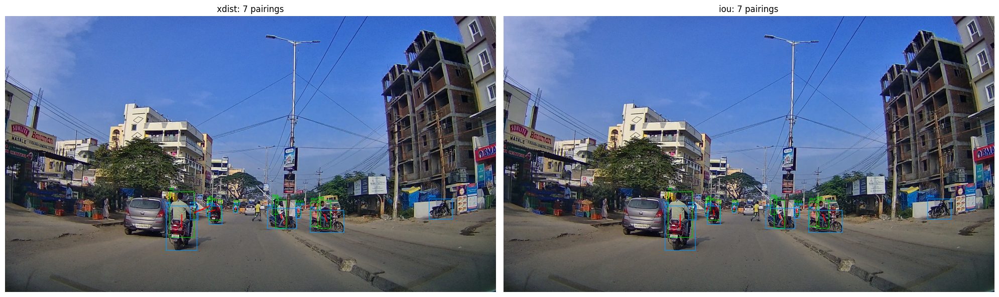

In [23]:
# Draw both sets of pairings on the frame so the difference becomes visible.
def draw_pairings(img, riders, motorcycles, pairs):
    # Work on a copy so the original frame stays clean for the second panel.
    img = img.copy()
    # Outline every rider in green and label it with its identifier.
    for rid, box in riders.items():
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 200, 0), 2)
        cv2.putText(img, f"R{rid}", (x1, max(y1-8, 15)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 200, 0), 2)
    # Outline every motorcycle in blue and label it with its identifier.
    for mid, box in motorcycles.items():
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 150, 0), 2)
        cv2.putText(img, f"M{mid}", (x1, max(y1-8, 15)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 150, 0), 2)
    # Connect each accepted pairing with a line between the two box centres.
    for rid, mid in pairs.items():
        rx1, ry1, rx2, ry2 = map(int, riders[rid])
        mx1, my1, mx2, my2 = map(int, motorcycles[mid])
        cv2.line(img, ((rx1+rx2)//2, (ry1+ry2)//2), ((mx1+mx2)//2, (my1+my2)//2), (0, 0, 255), 3)
    # Convert to RGB so matplotlib renders the colours correctly.
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Place the two methods side by side for direct comparison.
fig, axes = plt.subplots(1, 2, figsize=(20, 8))
axes[0].imshow(draw_pairings(frame_img, riders, motorcycles, xdist_pairs))
axes[0].set_title(f"xdist: {len(xdist_pairs)} pairings")
axes[0].axis("off")
axes[1].imshow(draw_pairings(frame_img, riders, motorcycles, iou_pairs))
axes[1].set_title(f"iou: {len(iou_pairs)} pairings")
axes[1].axis("off")
plt.tight_layout()
plt.show()

The `xdist` panel draws more lines, and some of them connect riders to
motorcycles they have no contact with, selected because their horizontal
positions happened to align. With a 300 pixel threshold applied to a frame
2560 pixels wide, a considerable portion of the image qualifies as "close".

The `iou` panel draws fewer lines and leaves some riders unpaired. Every line it
does draw corresponds to genuine box overlap.

For this system that trade is clearly worthwhile. An incorrect pairing can
attribute a violation to the wrong rider. A missing pairing merely means that
rider is not examined *in this frame*, and matching runs again on the next
frame, and the one after that.

In [24]:
# Apply the head match to the same frame, passing the confidence tables through.
head_matches = associate_heads_to_riders(
    riders, det["helmet"], det["no_helmet"],
    helmet_confs=confs["helmet"], no_helmet_confs=confs["no_helmet"],
)

# Report each rider's helmet status alongside the detector's own confidence.
for rider_id, (status, model_conf) in head_matches.items():
    conf_str = f"{model_conf:.2f}" if model_conf is not None else "n/a"
    print(f"rider {rider_id:<6} {status:<10} (model confidence {conf_str})")

rider 3      no_helmet  (model confidence 0.76)
rider 5      no_helmet  (model confidence 0.46)
rider 71     helmet     (model confidence 0.70)


In [25]:
# Apply the third match, pairing number plates with motorcycles.
plate_matches = associate_plates_to_motorcycles(motorcycles, det["license_plate"])

# Report how many of the detected plates were successfully attributed.
print(f"{len(det['license_plate'])} plates detected, {len(plate_matches)} matched to a motorcycle")
for mid, pid in plate_matches.items():
    print(f"  motorcycle {mid} -> plate {pid}")

2 plates detected, 2 matched to a motorcycle
  motorcycle 1 -> plate 69
  motorcycle 143 -> plate 10


The plate threshold of 100 pixels is more generous than the 60 pixels used for
heads. Number plates are small and frequently partly obscured, so their
detected centres vary more than a head's does.

## **What Remains Missing**

Every match performed here occurs within a single frame and is recomputed from
scratch on the next one. Nothing yet remembers that rider seven was paired with
motorcycle twelve a moment ago, or that they appeared helmetless for three
consecutive frames. That memory is what the next two modules add.

---

# **5. rm_instance.py: The Pipeline's Memory**

## **The Problem**

Everything so far operates frame by frame. Detection examines one frame.
Association matches boxes within one frame. Neither remembers anything.

A violation, however, is not a property of a frame. It is a property of a
**rider**, accumulated over the period during which they were visible.
Something must hold that accumulating record.

This module provides it, in the form of two small classes: one record per
rider, and a manager that owns all of them.

## **The Record**

`RMInstance` represents one rider and motorcycle pairing, together with
everything the pipeline will eventually learn about it.

Most of its fields begin as `None` and are populated later by other stages.
The temporal module writes the helmet status; the association module supplies
the plate. The object is created early and completed gradually.

## **The Voting Buffer**

It is possible for the tracker or association to assign a different motorcycle to the same rider across frames.

Accepting the latest answer would make `motorcycle_id` unstable, therefore the last five assignments are maintained in a deque, and each time we find the most common motorcycle in the buffer and assign it to `motorcycle_id`. This is a simple majority voting, on 6th frame, 1st frame's motorcycle will be removed from the buffer, and the new one will be added to the buffer.

In [26]:
%%writefile src/rm_instance.py

"""
The pipeline's memory: the RMInstance data model and its manager.

Detection and association operate one frame at a time and retain nothing.
A violation, however, is a property of a rider accumulated across the whole
period they were visible. These two classes hold that accumulating record.
"""

# Counter tallies repeated values; deque provides a fixed-length rolling window.
from collections import Counter, deque

# One record per rider, holding everything the pipeline learns about them.
class RMInstance:
    # Create the record the first time a rider is paired with a motorcycle.
    def __init__(self, motorcycle_id, rider_id, buffer_size=5):
        # Tracking identifier of the rider, which also keys this record.
        self.rider_id = rider_id
        # Current best estimate of which motorcycle this rider is travelling on.
        self.motorcycle_id = motorcycle_id
        # Rolling window of recent motorcycle assignments. Appending beyond the
        # maximum length automatically discards the oldest entry.
        self._moto_votes = deque(maxlen=buffer_size)
        # Seed the window with the assignment that created this record.
        self._moto_votes.append(motorcycle_id)
        # Helmet verdict, written later by the temporal stage.
        self.helmet_status = None
        # Averaged detector confidence supporting that verdict.
        self.confidence = None
        # Recognised plate text, reserved for a future text recognition step.
        self.plate_number = None
        # Bounding box of the matched number plate, supplied by association.
        self.plate_box = None
        # Final verdict: True, False, or None when evidence is insufficient.
        self.is_violation = None

    # Record one further frame's opinion of which motorcycle this rider is on.
    def vote_motorcycle(self, motorcycle_id):
        # Append the new observation, automatically discarding the oldest.
        self._moto_votes.append(motorcycle_id)
        # The majority of the recent window becomes the accepted answer, so a
        # single misassigned frame cannot change the result on its own.
        self.motorcycle_id = Counter(self._moto_votes).most_common(1)[0][0]

    # Readable one-line summary, used when writing the final report to disk.
    def __repr__(self):
        # Report the identifiers alongside every decision made so far.
        return (f"RMInstance(moto={self.motorcycle_id}, rider={self.rider_id}, "
                f"helmet={self.helmet_status}, plate={self.plate_number}, "
                f"violation={self.is_violation})")


# Owns every RMInstance and returns the correct one on request.
class RMInstanceManager:
    # Start with no records; they are created as riders appear in the video.
    def __init__(self):
        # Keyed by rider identifier, because the violation belongs to the rider.
        self.instances_by_rider = {}

    # Return this rider's record, creating it the first time they are seen.
    def get_or_create(self, rider_id, motorcycle_id):
        # A rider not encountered before requires a new record.
        if rider_id not in self.instances_by_rider:
            # Create the record and store it against the rider's identifier.
            self.instances_by_rider[rider_id] = RMInstance(motorcycle_id=motorcycle_id, rider_id=rider_id)
        # A rider already known simply contributes one further vote.
        else:
            # Add this frame's motorcycle assignment to the rolling window.
            self.instances_by_rider[rider_id].vote_motorcycle(motorcycle_id)
        # In either case, return the record so the caller can read or update it.
        return self.instances_by_rider[rider_id]

    # Every record currently held, returned as a list for reporting.
    def all_instances(self):
        # Dictionary values converted to a list for stable iteration.
        return list(self.instances_by_rider.values())

    # Aggregate counts describing the run as a whole.
    def summary(self):
        # Total number of distinct rider tracking identifiers encountered.
        total = len(self.instances_by_rider)
        # Riders for which the temporal stage reached a helmet verdict.
        with_helmet_status = sum(1 for i in self.instances_by_rider.values() if i.helmet_status)
        # Riders confirmed as violations.
        violations = sum(1 for i in self.instances_by_rider.values() if i.is_violation)
        # Returned as a dictionary so the caller can print or store it directly.
        return {"total_instances": total, "confident_helmet_status": with_helmet_status, "confirmed_violations": violations}

Overwriting src/rm_instance.py


## **Demonstration: The Voting Buffer Rejecting Noise**

The sequence below feeds a record a run of motorcycle assignments in which one
value occasionally disagrees. Observe that a single dissenting frame never
changes the accepted answer.

In [27]:
# The classes written above.
from src.rm_instance import RMInstance, RMInstanceManager

# Create a record for rider 7, initially assigned to motorcycle 12.
inst = RMInstance(motorcycle_id=12, rider_id=7)
print(f"start:       moto={inst.motorcycle_id}   window={list(inst._moto_votes)}")

# Association wavers for a few frames before settling.
for m in [12, 15, 12, 12, 15, 12, 12]:
    # Each frame contributes one vote to the rolling window.
    inst.vote_motorcycle(m)
    # The accepted answer is the majority of the window, not the latest value.
    print(f"observed {m}: moto={inst.motorcycle_id}   window={list(inst._moto_votes)}")

start:       moto=12   window=[12]
observed 12: moto=12   window=[12, 12]
observed 15: moto=12   window=[12, 12, 15]
observed 12: moto=12   window=[12, 12, 15, 12]
observed 12: moto=12   window=[12, 12, 15, 12, 12]
observed 15: moto=12   window=[12, 15, 12, 12, 15]
observed 12: moto=12   window=[15, 12, 12, 15, 12]
observed 12: moto=12   window=[12, 12, 15, 12, 12]


In [28]:
# A genuine change of motorcycle, as opposed to momentary noise.
inst = RMInstance(motorcycle_id=12, rider_id=7)
# Establish a stable assignment first.
for m in [12, 12, 12]:
    inst.vote_motorcycle(m)
print(f"settled on motorcycle {inst.motorcycle_id}")

# The rider is now consistently observed on a different motorcycle.
print("\nrider now consistently observed on motorcycle 20:")
for m in [20, 20, 20, 20, 20]:
    # The window rolls forward and the old votes eventually fall out entirely.
    inst.vote_motorcycle(m)
    print(f"  window={list(inst._moto_votes)} -> moto={inst.motorcycle_id}")

settled on motorcycle 12

rider now consistently observed on motorcycle 20:
  window=[12, 12, 12, 12, 20] -> moto=12
  window=[12, 12, 12, 20, 20] -> moto=12
  window=[12, 12, 20, 20, 20] -> moto=20
  window=[12, 20, 20, 20, 20] -> moto=20
  window=[20, 20, 20, 20, 20] -> moto=20


The record adapts to a sustained change while ignoring isolated disagreement.
That balance is the purpose of the fixed-length window.

## **Demonstration: How Many Tracked Riders Are Real**

`total_instances` counts tracking identifiers, not people. Riders at the edge
of the frame, riders visible for four frames, and riders who receive a new
identifier after an occlusion all contribute to the total. Grouping riders by
how long each was tracked reveals the distribution.

In [29]:
import src.detection as detection

# Restart the stream for a fresh pass over the opening of the video.
results = model.track(
    source=config.VIDEO_PATH,
    classes=list(config.CLASS_NAMES.keys()),
    tracker=config.TRACKER,
    persist=True, stream=True, verbose=False,
)

# A manager to collect records, and a counter of how often each rider appeared.
manager = RMInstanceManager()
appearances = {}
# Limit the pass so the demonstration completes quickly.
FRAME_LIMIT = 300

# Process the opening frames, running only the first two pipeline stages.
for i, r in enumerate(results):
    # Stop once the frame budget is exhausted.
    if i >= FRAME_LIMIT:
        break
    # Reshape this frame's raw output into per-class tables.
    det_i, _ = detection.get_frame_detections(r)
    # Create or update a record for every rider matched to a motorcycle.
    for rider_id, moto_id in associate_riders_to_motorcycles(det_i["rider"], det_i["motorcycle"]):
        manager.get_or_create(rider_id, moto_id)
    # Separately, count how many frames each rider identifier appeared in.
    for rider_id in det_i["rider"]:
        appearances[rider_id] = appearances.get(rider_id, 0) + 1

# The aggregate counts are all that the first two stages can produce.
print(manager.summary())

{'total_instances': 42, 'confident_helmet_status': 0, 'confirmed_violations': 0}


In [30]:
# Group rider identifiers by how many frames they were tracked for.
buckets = {"1-2 frames": 0, "3-9 frames": 0, "10-29 frames": 0, "30+ frames": 0}
for n in appearances.values():
    if n <= 2:    buckets["1-2 frames"] += 1
    elif n < 10:  buckets["3-9 frames"] += 1
    elif n < 30:  buckets["10-29 frames"] += 1
    else:         buckets["30+ frames"] += 1

# Display the distribution as a simple text histogram.
print(f"{len(appearances)} distinct rider identifiers observed\n")
for k, v in buckets.items():
    print(f"  {k:<14} {v:>3}  {'#' * v}")

55 distinct rider identifiers observed

  1-2 frames      11  ###########
  3-9 frames      16  ################
  10-29 frames     9  #########
  30+ frames      19  ###################


The identifiers lasting one or two frames are largely noise: a partially
visible rider at the edge of the frame, or a detection that did not hold.

This is precisely the population that `MIN_OBSERVATIONS = 3` filters out in the
next stage. The manager deliberately retains everything, because discarding
data early is difficult to undo and it is the decision logic that should apply
the standard.

---

# **6. temporal.py: Reaching a Verdict**

### **The Problem**

This is the module in which the system decides.

Everything preceding it produced observations. Detection located heads,
association matched them to riders, and the manager collected them. Nothing has
yet stated that a particular rider was not wearing a helmet.

The reason this is a separate step is that a single frame cannot be trusted. A
rider passes behind a post, the image blurs over a bump, the sun catches a dark
helmet at an unhelpful angle. Any individual frame may be wrong.

### **What Arrives Here**

The `observations` dictionary accumulates during the pipeline loop. Each rider
maps to a list of `(status, model_confidence)` tuples, with one entry per frame
in which that rider was matched to a head detection.

```python
observations[7] = [
    ("no_helmet", 0.91),
    ("no_helmet", 0.88),
    ("helmet",    0.62),   # one frame disagreed
    ("no_helmet", 0.93),
]
```

The second element of each tuple is the **model's** confidence in that
individual detection, which becomes important shortly.

### **Returning `None` Is a Genuine Answer**

```python
if len(votes) < min_observations:
    return None
```

There are three possible outcomes here rather than two: helmet, no helmet, and
*insufficient evidence*. The third is a deliberate feature.

A rider glimpsed twice at the far edge of the frame produces `None`. This is
not a guess, and not a default assumption of compliance. It is an explicit
refusal to decide. Most riders in any given video fall into this category, and
that represents the system working as intended.

### **Which Confidence Is Being Averaged**

This line warrants close attention, because it is easily misread:

```python
agreeing_confs = [v[1] for v in votes if v[0] == status and v[1] is not None]
```

It averages **the detector's own confidence scores**, taken only over the
frames that agree with the majority status. It is *not* the fraction of frames
that agreed.

These are different numbers answering different questions:

| Quantity | Question it answers |
|---|---|
| Vote agreement | How consistent was the rider across frames? |
| Average model confidence | How certain was the detector when it agreed? |

The code uses the second. A consequence follows, and it is worth observing
directly rather than merely describing.

## **Three-Valued Logic**

`decide_violation` returns `True`, `False`, or `None`, and all three carry
distinct meaning:

- **`True`** indicates a confirmed violation.
- **`False`** indicates a rider confirmed to be wearing a helmet.
- **`None`** indicates that the system declines to state an opinion.

In [31]:
%%writefile src/temporal.py

"""
Temporal smoothing and the violation decision.

A single frame cannot be trusted, because a rider may be blurred, partly
occluded, or captured at an unhelpful angle. These two functions combine many
frames into one verdict, and decline to answer when evidence is insufficient.
"""

# Counter is used to identify the status that occurs most frequently.
from collections import Counter
# Evidence thresholds are defined centrally rather than inside this module.
from src.config import MIN_OBSERVATIONS, MIN_CONFIDENCE


# Summarise every observation recorded for one rider.
def smooth_helmet_status(observations, rider_id, min_observations=None):
    """observations[rider_id] is a list of (status, model_confidence) tuples,
    with one entry per frame in which that rider was matched to a head.

    Returns (majority_status, average_model_confidence). The average is taken
    over the agreeing frames only, and is the detector's own confidence rather
    than a vote-agreement fraction.
    """
    # Apply the configured minimum unless the caller supplies another.
    min_observations = min_observations if min_observations is not None else MIN_OBSERVATIONS
    # Every observation recorded for this rider, or an empty list if none exist.
    votes = observations.get(rider_id, [])
    # Too little evidence exists to state anything at all.
    if len(votes) < min_observations:
        # None is a genuine third outcome: the system declines to decide.
        return None

    # Discard the confidence values and retain only the status labels.
    statuses = [v[0] for v in votes]
    # The label occurring most often becomes this rider's smoothed status.
    status, _ = Counter(statuses).most_common(1)[0]

    # Collect the detector's scores from the frames agreeing with the majority.
    agreeing_confs = [v[1] for v in votes if v[0] == status and v[1] is not None]
    # Average those scores, reporting None when no usable score was recorded.
    avg_confidence = sum(agreeing_confs) / len(agreeing_confs) if agreeing_confs else None

    # Return the status together with the confidence supporting it.
    return status, avg_confidence


# Convert a smoothed summary into a final verdict.
def decide_violation(smoothed_result, min_confidence=None):
    """Returns True for a confirmed violation, False for a confirmed helmet,
    and None when the system declines to judge. All three are distinct."""
    # Apply the configured confidence floor unless the caller overrides it.
    min_confidence = min_confidence if min_confidence is not None else MIN_CONFIDENCE
    # Smoothing already refused to answer, usually for want of observations.
    if smoothed_result is None:
        # Pass that refusal through unchanged.
        return None
    # Separate the majority status from the confidence supporting it.
    status, confidence = smoothed_result
    # Reject a verdict that no score supports, or one the detector was unsure of.
    if confidence is None or confidence < min_confidence:
        # None again, here meaning insufficient confidence rather than compliance.
        return None
    # Only a confirmed absence of a helmet constitutes a violation.
    return status == "no_helmet"

Overwriting src/temporal.py


## **Demonstration: Confidence Is Not Agreement**

Two riders below both reach a majority verdict of `no_helmet` from three
observations. One agreed with itself in every frame; the other disagreed in one
frame out of three. Examine the confidence each one reports.

In [32]:
# The two functions written above.
from src.temporal import smooth_helmet_status, decide_violation
from collections import Counter

# A rider whose three observations all agree.
unanimous = [("no_helmet", 0.90), ("no_helmet", 0.88), ("no_helmet", 0.92)]
# A rider whose middle observation contradicts the other two.
split     = [("no_helmet", 0.90), ("helmet", 0.85), ("no_helmet", 0.92)]

# Assemble both into the observations structure the function expects.
obs = {1: unanimous, 2: split}

# Report the vote agreement and the reported confidence side by side.
for rid, votes in obs.items():
    # The status labels alone, for computing agreement.
    statuses = [v[0] for v in votes]
    # The proportion of frames agreeing with the majority label.
    agreement = statuses.count(Counter(statuses).most_common(1)[0][0]) / len(votes)
    # The value the function actually reports.
    result = smooth_helmet_status(obs, rid)
    print(f"rider {rid}: {statuses}")
    print(f"   vote agreement:  {agreement:.0%}")
    print(f"   reported result: {result[0]}, confidence {result[1]:.2f}\n")

rider 1: ['no_helmet', 'no_helmet', 'no_helmet']
   vote agreement:  100%
   reported result: no_helmet, confidence 0.90

rider 2: ['no_helmet', 'helmet', 'no_helmet']
   vote agreement:  67%
   reported result: no_helmet, confidence 0.91



Rider 1 agreed with itself in every frame. Rider 2 disagreed a third of the
time. Both report approximately the same confidence, because the disagreeing
frames are simply excluded from the average.

The dissent is invisible in the output. Whether that behaviour is desirable
depends on what the number is intended to mean, but it is important to
recognise that the reported confidence says nothing about consistency.

## **Demonstration: The Complete Decision Table**

The cell below passes a range of cases through both functions, illustrating
every outcome the decision layer can produce.

In [33]:
# A set of representative observation lists covering each possible outcome.
cases = {
    "seen once":            [("no_helmet", 0.95)],
    "seen twice":           [("no_helmet", 0.95), ("no_helmet", 0.93)],
    "3x confident":         [("no_helmet", 0.91), ("no_helmet", 0.88), ("no_helmet", 0.94)],
    "3x low confidence":    [("no_helmet", 0.55), ("no_helmet", 0.61), ("no_helmet", 0.58)],
    "helmet, confident":    [("helmet", 0.89), ("helmet", 0.92), ("helmet", 0.87)],
    "split, high conf":     [("no_helmet", 0.93), ("helmet", 0.80), ("no_helmet", 0.91)],
    "borderline 0.70":      [("no_helmet", 0.70), ("no_helmet", 0.70), ("no_helmet", 0.70)],
}

# Column headings for the table.
print(f"{'case':<22}{'smoothed':<30}{'verdict'}")
print("-" * 70)
# Evaluate each case through smoothing and then through the decision.
for name, votes in cases.items():
    # Wrap the list in the observations structure keyed by a dummy rider id.
    o = {1: votes}
    # Stage one: summarise the evidence.
    s = smooth_helmet_status(o, 1)
    # Stage two: decide whether that evidence is sufficient.
    v = decide_violation(s)
    # Render the smoothing result, distinguishing a refusal from a summary.
    s_str = "None (too few observations)" if s is None else f"{s[0]}, confidence {s[1]:.2f}"
    # Render the verdict, naming all three possible outcomes explicitly.
    v_str = {True: "True: violation", False: "False: compliant", None: "None: undetermined"}[v]
    print(f"{name:<22}{s_str:<30}{v_str}")

case                  smoothed                      verdict
----------------------------------------------------------------------
seen once             None (too few observations)   None: undetermined
seen twice            None (too few observations)   None: undetermined
3x confident          no_helmet, confidence 0.91    True: violation
3x low confidence     no_helmet, confidence 0.58    None: undetermined
helmet, confident     helmet, confidence 0.89       False: compliant
split, high conf      no_helmet, confidence 0.92    True: violation
borderline 0.70       no_helmet, confidence 0.70    None: undetermined


Three of these cases merit particular attention:

1. **"seen twice"** contains a detection at 0.95 confidence and still returns
   nothing. The observation count gate is applied first and is indifferent to
   how confident any individual frame was.
2. **"3x low confidence"** clears the count requirement but fails the
   confidence threshold. The detector observed the same thing three times and
   was uncertain on every occasion.
3. **"split, high conf"** is confirmed as a violation despite one frame in
   three disagreeing. This is the direct consequence of averaging model
   confidence rather than vote agreement.

---

# **7. visualization.py: Producing Reviewable Evidence**

## **The Problem**

The pipeline has decided. A particular rider was not wearing a helmet, across
enough frames, with enough confidence.

Someone must now examine that conclusion. A violation existing only as `True`
in a dictionary is of little use, because the purpose of this system is to
produce evidence a human can review before anything becomes a citation.

This module converts pipeline state into images. It contains two functions: one
crops a number plate, and one draws a full frame with every rider colour-coded
by status.

## **Cropping a Plate, and the Clamping**

```python
x1, y1 = max(0, int(x1)-padding), max(0, int(y1)-padding)
x2, y2 = min(w, int(x2)+padding), min(h, int(y2)+padding)
```

The padding widens the box slightly, because detection boxes sit tightly
against the plate and text recognition performs better with a margin.

A plate detected at the very edge of the frame, however, would push the padded
box outside the image. Array slicing does not raise an error on out-of-range
indices; it silently returns a smaller array, or an empty one. The clamps keep
the crop inside the frame so downstream code receives what it expects.

Note also that `frame_image[y1:y2, x1:x2]` is **rows first, then columns**,
meaning y precedes x. This ordering causes frequent confusion, because box
coordinates are conventionally written x first.

## **The Copy on the First Line**

```python
img = frame_image.copy()
```

OpenCV drawing functions modify the array in place. Without the copy, the
function would write onto the original frame the model returned, and every
subsequent use of that frame would carry the annotations. In a loop that draws
several times per frame, the boxes would accumulate.

## **The Four Visual States**

The conditional chain makes the three-valued logic from `temporal.py` visible.

| Colour | Meaning | `is_violation` |
|---|---|---|
| Grey | Detected, but no record exists yet | No instance |
| Orange | Tracked, still undetermined | `None` |
| Red | Confirmed violation | `True` |
| Green | Confirmed compliant | `False` |

## **Channel Order**

```python
(0, 0, 255)   # red
(0, 200, 0)   # green
(0, 165, 255) # orange
```

OpenCV orders colour channels blue, green, red. Consequently `(0, 0, 255)` is
red rather than blue. Anything drawn with OpenCV and displayed with matplotlib
requires `cv2.cvtColor(img, cv2.COLOR_BGR2RGB)` first, or the colours invert.

## **The Highlight Parameter**

Two different tasks require two different images.

- **Without a highlight**, every rider is drawn in their own status colour.
  This is the debugging view, answering the question: what does the system
  currently believe about everyone in the frame?
- **With a highlight**, one rider appears in full colour while everyone else is
  dimmed to a thin grey outline with no label. This is the evidence view.

The distinction matters because a snapshot attached to a citation must be
unambiguous about whom it accuses. A frame containing four red boxes raises the
question of which rider the citation concerns.

In [34]:
%%writefile src/visualization.py

"""
Plate cropping and the rendering of pipeline state onto video frames.

A violation stored as True in a dictionary is not evidence. This module
produces the images a human reviewer actually examines.
"""

# OpenCV supplies the drawing primitives and the image array conventions.
import cv2


# Cut a tight image of a number plate out of a full frame.
def crop_plate(frame_image, plate_box, padding=5):
    """The padding widens the box slightly, because detection boxes sit tight
    against the plate and later text recognition performs better with a margin."""
    # Frame height and width, required to keep the crop inside the image.
    h, w = frame_image.shape[:2]
    # The plate's detected corner coordinates.
    x1, y1, x2, y2 = plate_box
    # Expand the top-left corner outwards, clamped so it cannot become negative.
    x1, y1 = max(0, int(x1)-padding), max(0, int(y1)-padding)
    # Expand the bottom-right corner outwards, clamped to the frame's edges.
    x2, y2 = min(w, int(x2)+padding), min(h, int(y2)+padding)
    # Array slicing is rows first and columns second, so y precedes x here.
    return frame_image[y1:y2, x1:x2]


# Draw every rider and motorcycle in a frame, coloured by current status.
def draw_rm_instances(frame_image, det, instances_by_rider, highlight_rider_id=None):
    """When highlight_rider_id is supplied, only that rider receives a status
    colour and every other rider is dimmed to grey, producing an unambiguous
    evidence image. When it is None, every rider is drawn in their own status
    colour, which is the view used for debugging."""
    # Work on a copy, because OpenCV draws in place and the original frame is
    # reused elsewhere in the pipeline.
    img = frame_image.copy()

    # Examine every rider detected in this frame.
    for rider_id, box in det["rider"].items():
        # Convert the box corners to integers, as drawing requires pixel indices.
        x1, y1, x2, y2 = map(int, box)
        # The accumulated record for this rider, if one exists yet.
        inst = instances_by_rider.get(rider_id)

        # Evidence mode: every rider other than the subject is drawn faintly.
        if highlight_rider_id is not None and rider_id != highlight_rider_id:
            # Neutral grey, no label, and the thinnest outline.
            color, label, thickness = (140, 140, 140), "", 1
        # A rider detected but not yet paired with a motorcycle has no record.
        elif inst is None:
            # Grey with a plain identifier label and no status claim.
            color, label, thickness = (150, 150, 150), f"rider {rider_id}", 2
        # Confirmed violation. The explicit comparison against True matters.
        elif inst.is_violation is True:
            # Red in blue-green-red channel order, drawn thickest for emphasis.
            color, label, thickness = (0, 0, 255), f"rider {rider_id}: NO HELMET", 3
        # Confirmed compliant. Testing against False keeps None out of this branch.
        elif inst.is_violation is False:
            # Green, indicating the helmet was verified across enough frames.
            color, label, thickness = (0, 200, 0), f"rider {rider_id}: helmet OK", 2
        # The remaining case is is_violation being None, meaning undetermined.
        else:
            # Orange, marking a rider the system is still gathering evidence on.
            color, label, thickness = (0, 165, 255), f"rider {rider_id}: pending", 2

        # Outline the rider using the colour and thickness selected above.
        cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)
        # Dimmed riders carry no label, so draw text only when one was set.
        if label:
            # Place the label above the box, pushed down when the box is near
            # the top edge and the text would otherwise fall outside the frame.
            cv2.putText(img, label, (x1, max(y1-10, 15)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    # Draw every motorcycle thinly, as supporting context rather than a subject.
    for moto_id, box in det["motorcycle"].items():
        # Integer corner coordinates for drawing.
        x1, y1, x2, y2 = map(int, box)
        # A thin outline in a colour distinct from every rider status colour.
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 150, 0), 1)

    # Return the annotated copy, leaving the original frame untouched.
    return img

Overwriting src/visualization.py


## **Demonstration: The Debugging View and the Evidence View**

The cell below runs the first five stages over the opening of the video, then
renders the same frame twice: once showing every rider's status, and once
isolating a single confirmed violator.

In [35]:
# The rendering functions written above.
from src.visualization import draw_rm_instances, crop_plate

# Restart the stream for a pass that exercises the decision stages as well.
results = model.track(
    source=config.VIDEO_PATH,
    classes=list(config.CLASS_NAMES.keys()),
    tracker=config.TRACKER,
    persist=True, stream=True, verbose=False,
)

# Fresh state for this pass.
manager = RMInstanceManager()
observations = {}
# Frames retained for drawing, chosen because they show a mixture of states.
frames = {}
FRAME_LIMIT = 300

# Process the opening frames through detection, association and decision.
for i, r in enumerate(results):
    # Stop once the frame budget is exhausted.
    if i >= FRAME_LIMIT:
        break
    # Reshape the raw output into per-class tables.
    det_i, confs_i = detection.get_frame_detections(r)
    # Create or update a record for every rider matched to a motorcycle.
    for rider_id, moto_id in associate_riders_to_motorcycles(det_i["rider"], det_i["motorcycle"]):
        manager.get_or_create(rider_id, moto_id)
    # Append this frame's helmet observation for every matched rider.
    for rider_id, (status, conf) in associate_heads_to_riders(
            det_i["rider"], det_i["helmet"], det_i["no_helmet"],
            helmet_confs=confs_i["helmet"], no_helmet_confs=confs_i["no_helmet"]).items():
        observations.setdefault(rider_id, []).append((status, conf))
    # Re-evaluate every rider's verdict using all evidence gathered so far.
    for rider_id, inst in manager.instances_by_rider.items():
        inst.is_violation = decide_violation(smooth_helmet_status(observations, rider_id))
    # Retain a few frames in which riders occupy more than one visual state.
    states = {inst.is_violation for inst in manager.instances_by_rider.values()}
    if len(states) >= 2 and len(frames) < 3:
        frames[i] = (r.orig_img.copy(), det_i)

# Report the aggregate result and which frames were retained.
print(manager.summary())
print("frames retained for rendering:", list(frames))

{'total_instances': 41, 'confident_helmet_status': 0, 'confirmed_violations': 2}
frames retained for rendering: [3, 4, 5]


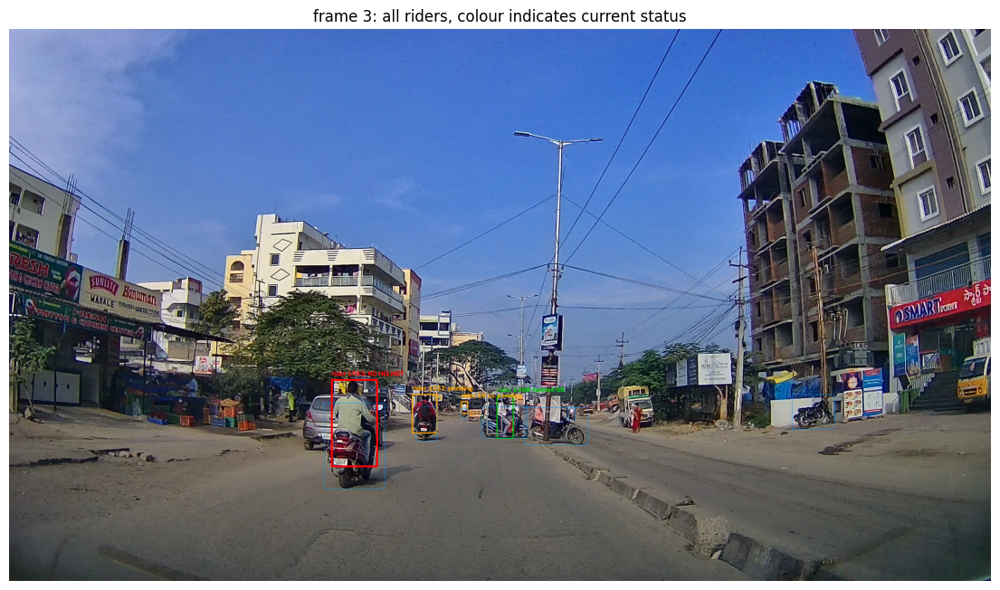

In [36]:
# Select the first retained frame and render every rider in their own colour.
frame_idx = list(frames)[0]
img, det_at_frame = frames[frame_idx]

# The debugging view: no highlight, so each rider shows their actual status.
annotated = draw_rm_instances(img, det_at_frame, manager.instances_by_rider)

# Display it, converting from OpenCV's channel order to matplotlib's.
plt.figure(figsize=(14, 8))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.title(f"frame {frame_idx}: all riders, colour indicates current status")
plt.axis("off")
plt.show()

The orange boxes are the most instructive. They mark riders the system is still
observing. They may turn red or green in a later frame, or remain orange until
the end of the video if the evidence never becomes strong enough.

A frame such as this is a snapshot of an ongoing decision rather than a final
answer.

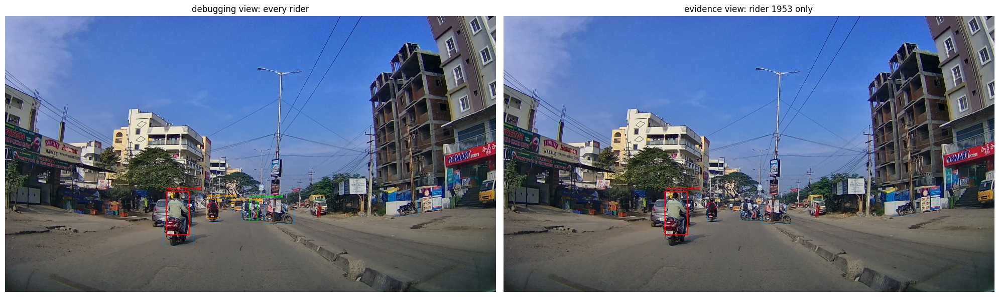

In [37]:
# Identify riders confirmed as violations who are also visible in this frame.
violators = [rid for rid, inst in manager.instances_by_rider.items()
             if inst.is_violation is True and rid in det_at_frame["rider"]]

# Render the evidence view only when there is a confirmed violator to highlight.
if violators:
    # Take the first confirmed violator as the subject of the evidence image.
    target = violators[0]
    # The evidence view: one rider in colour, everyone else dimmed to grey.
    evidence = draw_rm_instances(img, det_at_frame, manager.instances_by_rider,
                                 highlight_rider_id=target)
    # Place both views side by side so the difference is immediately visible.
    fig, axes = plt.subplots(1, 2, figsize=(20, 7))
    axes[0].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    axes[0].set_title("debugging view: every rider")
    axes[0].axis("off")
    axes[1].imshow(cv2.cvtColor(evidence, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"evidence view: rider {target} only")
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()
else:
    print("no confirmed violator visible in this frame; select another from `frames`")

The right-hand image is what would accompany a citation. One rider is named,
and everyone else is present for context while being visibly not the subject.

plate 1958: box [1073, 1041, 1089, 1051]
crop size: 36 x 29 px


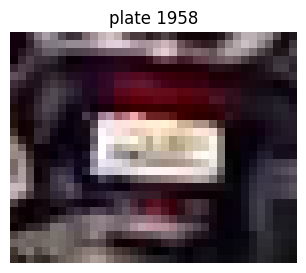

In [38]:
# Number plates detected in the frame being examined.
plates = det_at_frame["license_plate"]

# Crop and display one plate, if the frame contains any.
if plates:
    # Take the first plate present.
    pid = list(plates)[1]
    # Crop it with a generous margin, which assists later text recognition.
    crop = crop_plate(img, plates[pid], padding=10)
    # Report the source box and the resulting crop dimensions.
    print(f"plate {pid}: box {[round(v) for v in plates[pid]]}")
    print(f"crop size: {crop.shape[1]} x {crop.shape[0]} px")
    # Display the cropped region.
    plt.figure(figsize=(5, 3))
    plt.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
    plt.title(f"plate {pid}")
    plt.axis("off")
    plt.show()
else:
    print("no number plates detected in this frame")

Number plates at dashcam distance are typically a few dozen pixels wide.
Whether that resolution is sufficient for reliable text recognition remains an
open question, and it is one reason the recognition step has not yet been
integrated.

---

# **8. main.py: Running the Complete Pipeline**

## **The Loop**

Each preceding module performs one job. `main.py` is the loop that runs all of
them, frame by frame, across a real video.

The pipeline processes the video **one frame at a time**. For each frame, five
steps occur in sequence:

1. **Detect.** The model locates motorcycles, riders, helmets, no-helmets and
   number plates. `model.track()` additionally assigns a stable tracking
   identifier to each object, which allows it to be followed across frames.
2. **Associate riders with motorcycles.** Determine which rider is travelling
   on which vehicle.
3. **Associate heads with riders.** Determine whether each rider's head
   corresponds to a helmet detection or a no-helmet detection, and record that
   observation.
4. **Update the running verdict.** For every tracked rider, combine all
   observations gathered so far and determine whether sufficient evidence
   exists to declare a violation.
5. **Capture evidence.** When a rider is confirmed as a violation for the first
   time, save an annotated frame.

## **Why Verdicts Are Recomputed Every Frame**

Step four re-evaluates every rider on every frame rather than only at the end.
This is what allows the visualisation to display a live state, with riders
progressing from orange to red or green as evidence accumulates. The
computation is inexpensive, because smoothing operates on short lists of
observations rather than on image data.

## **Why Evidence Is Captured Only Once Per Rider**

The `already_captured` check ensures each confirmed violator produces exactly
one snapshot. Without it, a rider confirmed in frame 150 and still visible in
frame 400 would generate 250 nearly identical images.

## **Streaming Rather Than Accumulating**

`stream=True` causes the tracker to yield results one frame at a time instead
of building a list of every frame in memory. On a long video the difference is
the distinction between running and exhausting available memory, which is
particularly significant on constrained edge hardware.

In [39]:
%%writefile src/main.py

"""
The pipeline runner: every stage wired together and executed end to end.

This module owns the frame loop. Each individual stage lives in its own file
and is imported here, so this file describes the order of operations rather
than the operations themselves.
"""

# The os module is used to create the output directory and build file paths.
import os
# The YOLO class provides both detection and multi-object tracking.
from ultralytics import YOLO

# Paths, class names and thresholds.
import src.config as config
# Stage 1: reshape the raw model output into per-class tables.
from src.detection import get_frame_detections
# Stage 2: build the three kinds of relationship between detected objects.
from src.association import associate_riders_to_motorcycles, associate_heads_to_riders, associate_plates_to_motorcycles
# Stage 3: combine many frames into a single verdict.
from src.temporal import smooth_helmet_status, decide_violation
# Stage 4: the accumulating record held for each rider.
from src.rm_instance import RMInstanceManager
# Stage 5: render pipeline state into reviewable images.
from src.visualization import draw_rm_instances, crop_plate


# Process an entire video and return everything the run produced.
def run_pipeline(model_path=None, video_path=None, frame_limit=None, save_sample_frames=True):
    # Fall back to the configured weights when the caller supplies no path.
    model_path = model_path or config.MODEL_PATH
    # Fall back to the configured video when the caller supplies no path.
    video_path = video_path or config.VIDEO_PATH
    # Fall back to the configured frame cap, where None means the whole video.
    frame_limit = frame_limit if frame_limit is not None else config.FRAME_LIMIT

    # Load the trained detection weights into memory once.
    model = YOLO(model_path)

    # Begin tracking. stream=True yields one frame at a time rather than
    # accumulating every result, and persist=True carries tracking identifiers
    # forward between frames so a rider keeps the same ID throughout.
    results = model.track(
        source=video_path, classes=list(config.CLASS_NAMES.keys()),
        tracker=config.TRACKER, persist=True, stream=True, verbose=False,
    )

    # Holds one accumulating record per rider.
    manager = RMInstanceManager()
    # Maps each rider to the list of helmet observations recorded for them.
    observations = {}
    # Maps each motorcycle to the most recent number plate box matched to it.
    plate_matches = {}
    # Collects one annotated evidence image per confirmed violation.
    sample_frames = []

    # Counts how many frames were actually processed, for the final report.
    frame_count = 0
    # Process the video one frame at a time.
    for i, r in enumerate(results):
        # Stop early when a frame cap has been set and reached.
        if frame_limit is not None and i >= frame_limit:
            break
        # Frame numbering is one-based in the report, while i is zero-based.
        frame_count = i + 1

        # Step 1: reshape this frame's raw output into per-class tables.
        det, confs = get_frame_detections(r)

        # Step 2: pair riders with motorcycles and record each pairing as a vote.
        for rider_id, moto_id in associate_riders_to_motorcycles(det["rider"], det["motorcycle"]):
            manager.get_or_create(rider_id, moto_id)

        # Step 3: determine each rider's helmet status for this frame.
        head_matches = associate_heads_to_riders(
            det["rider"], det["helmet"], det["no_helmet"],
            helmet_confs=confs["helmet"], no_helmet_confs=confs["no_helmet"],
        )
        # Append the observation, building the history smoothing will later use.
        for rider_id, (status, model_conf) in head_matches.items():
            observations.setdefault(rider_id, []).append((status, model_conf))

        # Pair number plates with motorcycles and remember the plate's box.
        for moto_id, plate_id in associate_plates_to_motorcycles(det["motorcycle"], det["license_plate"]).items():
            plate_matches[moto_id] = det["license_plate"][plate_id]

        # Step 4: re-evaluate every rider's verdict from all evidence to date.
        for rider_id, inst in manager.instances_by_rider.items():
            # Summarise this rider's observations, which may return None.
            smoothed = smooth_helmet_status(observations, rider_id)
            # Store the majority status, or None when smoothing declined.
            inst.helmet_status = smoothed[0] if smoothed else None
            # Store the averaged detector confidence behind that status.
            inst.confidence = smoothed[1] if smoothed else None
            # Apply the confidence threshold to reach the final verdict.
            inst.is_violation = decide_violation(smoothed)
            # Attach the number plate of whichever motorcycle they are on.
            if inst.motorcycle_id in plate_matches:
                inst.plate_box = plate_matches[inst.motorcycle_id]

        # Step 5: capture one annotated snapshot per confirmed violation.
        if save_sample_frames:
            # Consider only riders actually visible in the current frame.
            for rider_id in det["rider"]:
                # The accumulated record for this rider, if one exists.
                inst = manager.instances_by_rider.get(rider_id)
                # Avoid producing a near-identical image on every later frame.
                already_captured = any(rid == rider_id for rid, _, _ in sample_frames)
                # Capture only on the first frame at which the verdict is True.
                if inst and inst.is_violation is True and not already_captured:
                    # Render the evidence view, highlighting this rider alone.
                    annotated = draw_rm_instances(r.orig_img, det, manager.instances_by_rider, highlight_rider_id=rider_id)
                    # Store the image alongside the rider and frame it came from.
                    sample_frames.append((rider_id, i, annotated))

    # Report what was processed and from where.
    print(f"Processed {frame_count} frames from: {video_path}")
    print(f"Model: {model_path}")
    # Report the aggregate counts the manager accumulated.
    for k, v in manager.summary().items():
        print(f"  {k}: {v}")

    # Return every artefact the run produced, for inspection by the caller.
    return manager, observations, plate_matches, sample_frames


# Write the text report and the evidence images to the output directory.
def save_outputs(manager, sample_frames, output_dir=None):
    # Fall back to the configured output location when none is supplied.
    output_dir = output_dir or config.OUTPUT_DIR
    # Create the directory if it does not already exist, without failing if it does.
    os.makedirs(output_dir, exist_ok=True)

    # Path of the plain-text summary of every record held.
    report_path = os.path.join(output_dir, "rm_instances_report.txt")
    # Write one line per record, using the readable form defined on RMInstance.
    with open(report_path, "w") as f:
        for inst in manager.all_instances():
            f.write(repr(inst) + "\n")
    # Confirm where the report was written.
    print(f"\nSaved report: {report_path}")

    # OpenCV is imported here because it is required only for image output.
    import cv2
    # Write one image file per captured violation, named for rider and frame.
    for rider_id, frame_num, img in sample_frames:
        img_path = os.path.join(output_dir, f"violation_rider{rider_id}_frame{frame_num}.png")
        cv2.imwrite(img_path, img)
    # Report the count only when at least one snapshot was produced.
    if sample_frames:
        print(f"Saved {len(sample_frames)} violation snapshot(s) to: {output_dir}")


# Executed only when this file is run directly, not when it is imported.
if __name__ == "__main__":
    # Run the full pipeline with every setting taken from the configuration.
    manager, observations, plate_matches, sample_frames = run_pipeline()
    # Write the report and the evidence images to disk.
    save_outputs(manager, sample_frames)

Overwriting src/main.py


## **Running the Complete System**

The cell below executes every stage in order over the opening 300 frames of the
sample video. Increase or remove `frame_limit` to process the entire clip.

In [40]:
# The runner written above.
from src.main import run_pipeline, save_outputs

# Execute the full pipeline, capped so the demonstration completes promptly.
manager, observations, plate_matches, sample_frames = run_pipeline(
    model_path=config.MODEL_PATH,
    video_path=config.VIDEO_PATH,
    frame_limit=300,
)

Processed 300 frames from: /content/edge-ai-helmet-detection-workshop/final/sample_videos/sample.mp4
Model: /content/edge-ai-helmet-detection-workshop/final/models/best.pt
  total_instances: 44
  confident_helmet_status: 16
  confirmed_violations: 2


In [41]:
# Write the text report and every evidence image to the output directory.
save_outputs(manager, sample_frames, output_dir=config.OUTPUT_DIR)


Saved report: /content/edge-ai-helmet-detection-workshop/final/output/rm_instances_report.txt
Saved 2 violation snapshot(s) to: /content/edge-ai-helmet-detection-workshop/final/output


## **Reviewing the Evidence**

Each image below is a frame at which a violation was confirmed, with the boxes
drawn on. The colours come from `visualization.py`:

- **Red** indicates a confirmed violation and names the rider concerned.
- **Green** indicates a rider confirmed to be wearing a helmet.
- **Orange** indicates a rider still under observation.
- **Grey** indicates context, either an unpaired rider or, in the evidence view,
  every rider other than the subject.

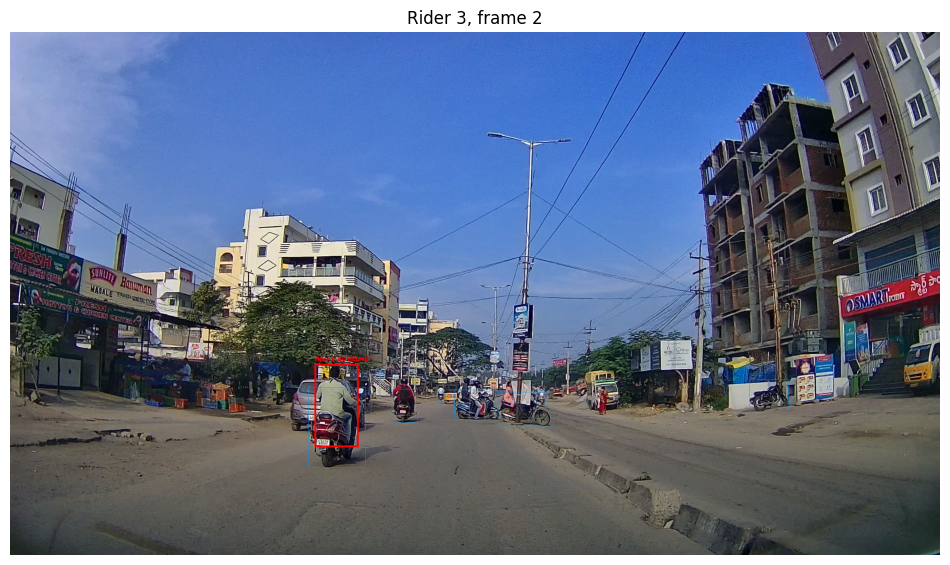

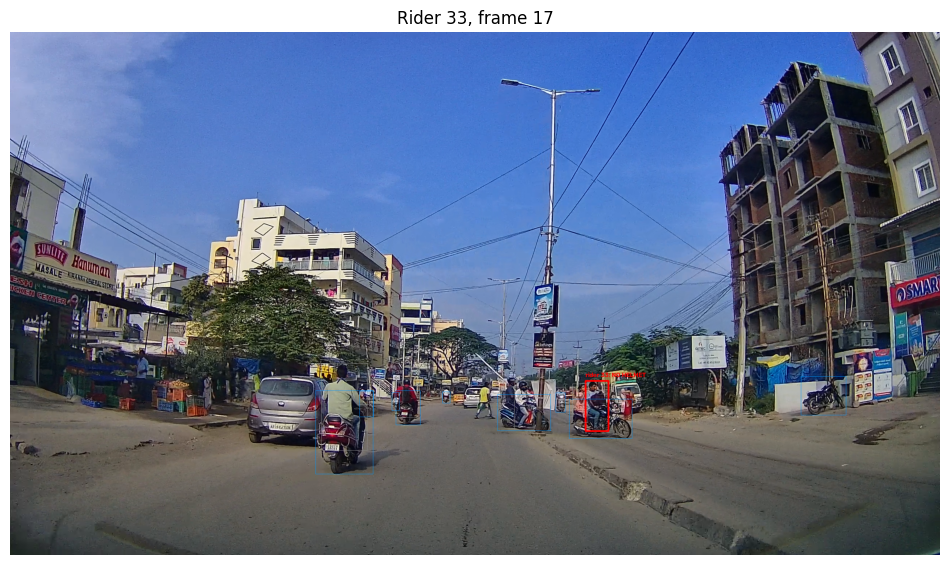

In [42]:
# Display every captured violation snapshot in turn.
for rider_id, frame_num, img in sample_frames:
    # One figure per violation, sized for readability.
    plt.figure(figsize=(12, 7))
    # Convert from OpenCV's channel order before displaying.
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    # Identify the rider and the frame the evidence was taken from.
    plt.title(f"Rider {rider_id}, frame {frame_num}")
    plt.axis("off")
    plt.show()

# Report when the frame budget produced no confirmed violations.
if not sample_frames:
    print("no violations confirmed in this frame range; raise frame_limit and run again")

---

# **Exercises**

The following modifications each isolate one design decision. Change the value,
re-execute the relevant `%%writefile` cell so the module is rewritten, then run
the pipeline again and compare the outcome.

## **1. Configuration Thresholds**

- Set `RIDER_MOTO_MAX_COST` to `1.0`. Any overlap now becomes acceptable,
  including none at all. How many additional pairings appear, and do they
  survive inspection of the frame?
- Reduce `MIN_OBSERVATIONS` to `1`. Violations will then be confirmed from
  single frames. Examine the additional violations and judge whether they hold
  up.
- Raise `MIN_CONFIDENCE` to `0.9`. The system becomes stricter and reports fewer
  violations. Determine which ones it now declines to call.

## **2. Geometry**

- Reposition the helmet box so it sits at the rider's waist rather than their
  head. Does `top_center` still rate it as close?
- Construct two boxes that share an edge but no area. What does `iou` return,
  and is that the answer the system requires?
- Consider a small box positioned entirely inside a large one. What is the IoU,
  and is that a satisfactory measure of "these belong together"? A helmet lies
  entirely inside a rider's box, and IoU would be low because the areas differ
  so greatly. This is precisely why helmet matching uses point distance rather
  than overlap.

## **3. Association**

- Pass `max_cost=1.0` to `associate_riders_to_motorcycles` to accept every
  pairing, and `max_cost=0.5` to demand fifty percent overlap. Count how many
  genuine pairings the stricter setting discards.
- The default `xdist` threshold of 300 pixels applies to a frame 2560 pixels
  wide, which is more than a tenth of the image. Try 100 and determine whether
  `xdist` begins to behave more like `iou`.

## **4. Memory**

- Construct `RMInstance(..., buffer_size=1)` so the most recent frame always
  prevails. Measure how much `motorcycle_id` fluctuates. Then try 15 and
  determine whether it becomes too slow to follow a genuine change of vehicle.
- Supply `vote_motorcycle` with an even split such as `[12, 20, 12, 20]` and
  observe which value `Counter.most_common` selects. Consider whether that
  behaviour is safe to rely upon.

## **5. Decision Logic**

- Write a variant of `decide_violation` that additionally requires, for
  instance, eighty percent of frames to agree on the status. Determine how many
  of the current violations it rejects. This is a small change with a
  substantial effect on which riders are flagged, and it forces the question of
  what "confident" ought to mean in a system that issues citations.

## **6. Visualisation**

- Replace `elif inst.is_violation is False` with a plain `else` and redraw.
  Undetermined riders turn green, meaning the system now displays "confirmed
  helmet OK" for people it has not judged. This demonstrates exactly what the
  explicit `is` comparisons protect against.
- Set the violation colour to `(255, 0, 0)` and observe what renders. Channel
  ordering means that value is blue.
- Vary the crop padding between `0` and `30` and judge which produces a more
  readable plate image.

# **Closing Observations**

Three principles run through the entire system and are worth stating
explicitly.

1. **Detection produces objects; the pipeline produces relationships.** Every
   link between a helmet and a rider, or a rider and a motorcycle, is inferred
   from geometry. Choosing the correct reference point for each inference is
   what separates a system that works from one that appears to work.
2. **Optimal assignment is not the same as acceptable assignment.** The
   Hungarian algorithm always returns the best available arrangement, which is
   why every association function applies a rejection threshold afterwards.
3. **"Unknown" is a legitimate verdict.** The three-valued logic running from
   `temporal.py` through `rm_instance.py` into `visualization.py` exists so the
   system can decline to accuse. In an application that may generate a traffic
   citation, that capacity is not a limitation. It is the feature that makes
   the system usable.